<a href="https://colab.research.google.com/github/naimaryan1/LunarMUnet/blob/main/Final_unet_lunar_rocks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Lunar Image Semnatic Segmentation

In [1]:
"""UNet based landescape image segmentation using Python 3.11 environment based
on open source data from pace Robotics Group of KeioUniversity in Japan & Kaggle"""
"""Imports"""
import copy
import os
import random
import shutil
import zipfile
from math import atan2, cos, sin, sqrt, pi, log
import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from PIL import Image
from numpy import linalg as LA
from torch import optim
from torch.utils.data import DataLoader, random_split, Dataset
from torchvision import transforms
from tqdm import tqdm
from google.colab import drive
from scipy.spatial.distance import cdist
"""End imports"""

"""1) Mount your Googel drive & navigate to correct path"""
drive.mount('/content/drive')

!ls ./drive/MyDrive/ECE551/unet/
#go to correct dir
!mkdir -p ./drive/MyDrive/ECE551/unet || cd ./drive/MyDrive/drive/ECE551/unet
!mkdir -p ./drive/MyDrive/ECE551/kaggle_lunar_images/images/fixed_ground

#IF you have issues with venv run "sudo apt-get install python3.11-venv"
#source the environment

!source ./drive/MyDrive/ECE551/unet/unet_venv/bin/activate
#ONE TIME INSTALL !pip install -r  ./drive/MyDrive/ECE551/unet/requirements.txt
"""2) we are going to use dataset that available in kaggle.
# You must get your API key from kaggle.com & create a
# kaggle.json with contents {"username":"USERNAME","key":"USER_KEY"}"""

!cp ./drive/MyDrive/kaggle.json /root/.config/kaggle/kaggle.json
!chmod 600 /root/.config/kaggle/kaggle.json

"""3) Call kaggle CLI. ONE TIME ONLY: download the dataset"""
#!kaggle datasets download romainpessia/artificial-lunar-rocky-landscape-dataset

#!cp /content/artificial-lunar-rocky-landscape-dataset.zip ./drive/MyDrive/ECE551/
#!mkdir -p /content/drive/MyDrive/ECE551/kaggle_lunar_images
#!unzip /content/drive/MyDrive/ECE551/kaggle_lunar_images/artificial-lunar-rocky-landscape-dataset.zip -d /content/drive/MyDrive/ECE551/kaggle_lunar_images/
"""OR try in the terminal
unzip ./content/drive/MyDrive/ECE551/unet/artificial-lunar-rocky-landscape-dataset.zip /content/drive/MyDrive/ECE551/kaggle_lunar_images
"""


Mounted at /content/drive
artificial-lunar-rocky-landscape-dataset.zip  requirements.txt		    unet_venv
manual_pip_install.sh			      unet_lunar_my_checkpoint.pth
cp: cannot create regular file '/root/.config/kaggle/kaggle.json': No such file or directory
chmod: cannot access '/root/.config/kaggle/kaggle.json': No such file or directory


'OR try in the terminal\nunzip ./content/drive/MyDrive/ECE551/unet/artificial-lunar-rocky-landscape-dataset.zip /content/drive/MyDrive/ECE551/kaggle_lunar_images\n'

In [2]:
"""Declarations Classes, functions, and code for Unet segmentation"""
"""model input layer size"""
IMG_HEIGHT = 256
IMG_WIDTH = 256
# Mapping predefined ground-truth colors to labels
color_map = {
    (0, 0, 0): 0,       # Ground Surface (Class 1)
    (255, 0, 0): 1,     # Sky (Class 2)
    (0, 255, 0): 2,     # Small Rocks (Class 3)
    (0, 0, 255): 3      # Large Rocks (Class 4)
}

class_name = ["Ground_Surface","Sky","Small_Rock","Large_Rock"]
class_colors = [[0, 0, 0],[255, 0, 0],[0, 255, 0],[0, 0, 255]]

# Convert color_map keys to a NumPy array for fast distance computation
color_values = np.array(list(color_map.keys()))

def k_means_clustering(image_path, attempted_accuracy, k):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    pixel_vals = image.reshape((-1, 3))
    pixel_vals = np.float32(pixel_vals)

    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, attempted_accuracy)
    _, labels, centers = cv2.kmeans(pixel_vals, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
    centers = np.uint8(centers)
    segmented_data = centers[labels.flatten()]
    segmented_image = segmented_data.reshape((image.shape))
    return segmented_image


def map_kmeans_to_gt(centers, gt_colors):
    """Maps K-means centers to the closest ground-truth colors."""
    distances = cdist(centers, gt_colors)  # Compute color distances
    closest_indices = np.argmin(distances, axis=1)  # Get closest GT color index
    return gt_colors[closest_indices]  # Replace centers with closest GT colors

def color_to_label(mask, color_map):
    """Convert an RGB mask to a labeled mask (H, W) based on predefined color mapping."""
    # Convert grayscale to RGB by stacking channels
    if len(mask.shape) == 2:  # If grayscale, convert to RGB
        mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)
    labeled_mask = np.zeros(mask.shape[:2], dtype=np.int32)

    for color, label in color_map.items():
        # Ensure color is a NumPy array for comparison
        color = np.array(color, dtype=np.uint8)

        # Apply the mapping
        labeled_mask[np.all(mask == color, axis=-1)] = label

    return labeled_mask

def compute_dice_coefficient(pred, true):
    intersection = np.logical_and(pred, true).sum()
    dice = (2 * intersection) / (pred.sum() + true.sum() + 1e-6)
    return dice

def compute_iou(pred, true):
    intersection = np.logical_and(pred, true).sum()
    union = np.logical_or(pred, true).sum()
    iou = intersection / (union + 1e-6)
    return iou

def evaluate_multiclass_segmentation(image_path, mask_path, color_map, attempted_accuracy=0.1, k=4):
    segmented_image = k_means_clustering(image_path, attempted_accuracy, k)
    ground_truth_mask = cv2.imread(mask_path)

    labeled_mask = color_to_label(ground_truth_mask, color_map)
    segmented_labeled = color_to_label(segmented_image, color_map)

    dice_scores = {label: 0 for label in color_map.values()}
    iou_scores = {label: 0 for label in color_map.values()}

    for label in np.unique(labeled_mask):
        dice = compute_dice_coefficient(segmented_labeled == label, labeled_mask == label)
        iou = compute_iou(segmented_labeled == label, labeled_mask == label)
        dice_scores[label] = dice
        iou_scores[label] = iou

    return dice_scores, iou_scores

"""k-means clustering - END"""


""" Unet Declarations - START"""
""" Double Convolution that is repeated in each step """
class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv_op = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.conv_op(x)


"""Downsample Class"""

class DownSample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = DoubleConv(in_channels, out_channels)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

    def forward(self, x):
        down = self.conv(x)
        p = self.pool(down)

        return down, p

"""Upsample Class"""

class UpSample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_channels, in_channels//2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        x = torch.cat([x1, x2], 1)
        return self.conv(x)


""" UNet architecture """
class UNet(nn.Module):
    def __init__(self, in_channels, num_classes):
        super().__init__()
        self.down_convolution_1 = DownSample(in_channels, 64)
        self.down_convolution_2 = DownSample(64, 128)
        self.down_convolution_3 = DownSample(128, 256)
        self.down_convolution_4 = DownSample(256, 512)

        self.bottle_neck = DoubleConv(512, 1024)

        self.up_convolution_1 = UpSample(1024, 512)
        self.up_convolution_2 = UpSample(512, 256)
        self.up_convolution_3 = UpSample(256, 128)
        self.up_convolution_4 = UpSample(128, 64)

        self.out = nn.Conv2d(in_channels=64, out_channels=num_classes, kernel_size=1)

    def forward(self, x):
        down_1, p1 = self.down_convolution_1(x)
        down_2, p2 = self.down_convolution_2(p1)
        down_3, p3 = self.down_convolution_3(p2)
        down_4, p4 = self.down_convolution_4(p3)

        b = self.bottle_neck(p4)

        up_1 = self.up_convolution_1(b, down_4)
        up_2 = self.up_convolution_2(up_1, down_3)
        up_3 = self.up_convolution_3(up_2, down_2)
        up_4 = self.up_convolution_4(up_3, down_1)

        out = self.out(up_4)
        return out

"""Dataset class returns dataset that from path and returns img,mask pair """
class LunarRocksDatasetFromDrive(Dataset):
    def __init__(self, train_path, masks_path, limit=None, INPUT_HEIGHT=512, INPUT_WIDTH=512):
        self.limit = limit
        self.INPUT_HEIGHT = INPUT_HEIGHT
        self.INPUT_WIDTH = INPUT_WIDTH

        # Load and sort images and masks
        self.images = sorted([os.path.join(train_path, i) for i in os.listdir(train_path)])[:self.limit]
        self.masks = sorted([os.path.join(masks_path, i) for i in os.listdir(masks_path)])[:self.limit]

        if self.limit is None:
            self.limit = len(self.images)

    def __getitem__(self, index):
        # Load image using OpenCV
        img = cv2.imread(self.images[index])  # Load in BGR format
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
        img = cv2.resize(img, (self.INPUT_WIDTH, self.INPUT_HEIGHT))  # Resize

        # Load mask using OpenCV
        mask = cv2.imread(self.masks[index])  # Load in BGR format
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)  # Convert to RGB
        mask = cv2.resize(mask, (self.INPUT_WIDTH, self.INPUT_HEIGHT))  # Resize

        return img, mask  # Returns NumPy arrays in RGB format

    def __len__(self):
        return min(len(self.images), self.limit)



"""Dataset class returns dataset that already loaded into memory as image, mask Tensors"""
class LunarRocksDatasetFromArray(Dataset):
    def __init__(self, imgs_array, masks_array, limit=None, INPUT_HEIGHT=512, INPUT_WIDTH=512):
        self.limit = limit if limit else len(imgs_array)
        self.images = imgs_array[:self.limit]  # Already loaded NumPy arrays
        self.masks = masks_array[:self.limit]  # Already loaded NumPy arrays

        self.INPUT_HEIGHT = INPUT_HEIGHT
        self.INPUT_WIDTH = INPUT_WIDTH

        self.transform = transforms.Compose([
            transforms.Resize((self.INPUT_HEIGHT, self.INPUT_WIDTH)),
            transforms.ToTensor()
        ])

    def __getitem__(self, index):
        image = self.images[index]
        mask = self.masks[index]

        # 1) Ensure mask is in RGB format
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)  # Convert to RGB if necessary

        # 2) Map image color channels (like RGB) to the labels
        # y = color_to_label(mask, color_map)

        # 3) Convert nparray -> PIl.img -> resize -> Tensor
        image = self.transform(Image.fromarray(image))

        # Resize the mask to the same dimensions (INPUT_HEIGHT, INPUT_WIDTH)
        mask = Image.fromarray(mask).resize((self.INPUT_WIDTH, self.INPUT_HEIGHT), Image.NEAREST)
        mask = transforms.ToTensor()(mask)

        # 4) correct input dimensions for the neural network
        # y = y.squeeze(0).long()

        return image, mask

    def __len__(self):
        return len(self.images)



def dice_coefficient(prediction, target, epsilon=1e-07):
    """
    The DICE metric provides a measure of the similarity between two sets,
    in this case, the predicted segmentation and the ground truth segmentation.
    It calculates the overlap between the two sets,
    taking into account both the false positives and false negatives.
    """
    prediction_copy = prediction.clone()

    prediction_copy[prediction_copy < 0] = 0
    prediction_copy[prediction_copy > 0] = 1

    intersection = abs(torch.sum(prediction_copy * target))
    union = abs(torch.sum(prediction_copy) + torch.sum(target))
    dice = (2. * intersection + epsilon) / (union + epsilon)

    return dice

#Visualize the random results
def random_images_inference(image_tensors, mask_tensors, image_paths, model_pth, device):
    model = UNet(in_channels=3, num_classes=4).to(device)
    model.load_state_dict(torch.load(model_pth, map_location=torch.device(device)))

    transform = transforms.Compose([
        transforms.Resize((256, 256))
    ])

    # Iterate for the images, masks and paths
    for image_pth, mask_pth in zip(image_tensors, mask_tensors):
        # Load the image
        img = transform(image_pth)

        # Predict the image with the model
        pred_mask = model(img.unsqueeze(0))
        pred_mask = pred_mask.squeeze(0).permute(1,2,0)

        # Load the mask to compare
        mask = transform(mask_pth).permute(1, 2, 0).to(device)

        #print(f"Image: {os.path.basename(image_paths)}, DICE coefficient: {round(float(dice_coefficient(pred_mask, mask)),5)}")

        # Show the images
        img = img.cpu().detach().permute(1, 2, 0)
        pred_mask = pred_mask.cpu().detach()
        pred_mask[pred_mask < 0] = 0
        pred_mask[pred_mask > 0] = 1

        plt.figure(figsize=(15, 16))
        plt.subplot(131), plt.imshow(img), plt.title("original")
        plt.subplot(132), plt.imshow(pred_mask, cmap="gray"), plt.title("predicted")
        plt.subplot(133), plt.imshow(mask, cmap="gray"), plt.title("mask")
        plt.show()
""" Unet Declarations - END"""

def display_images_in_grid(images, rows=10, cols=5, column_names=None):
    """
    Displays images in a grid with column names spaced exactly above each column.

    Parameters:
    - images (list): List of image arrays.
    - rows (int): Number of rows in the grid.
    - cols (int): Number of columns in the grid.
    - column_names (list of str, optional): List of column names to be displayed above each column.
    """
    fig, axs = plt.subplots(rows + 1, cols, figsize=(cols * 2, (rows + 0.5) * 2))  # Extra row for column names
    axs = axs.flatten()

    # Add column headers (if provided)
    if column_names:
        for col in range(min(cols, len(column_names))):
            axs[col].text(0.5, 1.2, column_names[col], fontsize=12, fontweight='bold', ha='center', va='bottom', transform=axs[col].transAxes)
        for col in range(cols):  # Remove axis for header row
            axs[col].axis('off')

    # Display images in the grid
    for i in range(rows * cols):
        if i >= len(images):
            break
        img = cv.cvtColor(images[i], cv.COLOR_BGR2RGB) if len(images[i].shape) == 3 else images[i]
        axs[i + cols].imshow(img, cmap='gray' if len(images[i].shape) == 2 else None)
        axs[i + cols].axis('off')

    # Turn off extra subplots if images are fewer than grid slots
    for j in range(i + cols + 1, (rows + 1) * cols):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

#has a fake sun
def add_fake_light(image, position, radius=100, intensity=0.7):
    """
    Adds a fake bright light source to an image.

    Parameters:
    - image (numpy array): The original image (BGR format).
    - position (tuple): (x, y) coordinates of the light source.
    - radius (int): Size of the light source.
    - intensity (float): Strength of the light (0 to 1).

    Returns:
    - numpy array: Image with the light effect.
    """
    # Create a black overlay the same size as the image
    overlay = np.zeros_like(image, dtype=np.uint8)

    # Draw a bright white circle at the desired position
    cv.circle(overlay, position, radius, (255, 255, 255), -1, cv.LINE_AA)

    # Apply Gaussian blur to create a soft light effect
    blurred_overlay = cv.GaussianBlur(overlay, (2 * radius + 1, 2 * radius + 1), 0)

    # Blend the light effect with the original image
    result = cv.addWeighted(image, 1, blurred_overlay, intensity, 0)

    return result


In [3]:
"""Init paths, initial params split data, visualize initial data"""
"""Setting up paths &  variables"""

ROOT = "drive/MyDrive/ECE551" #This is you top level project dir
WORKING_DIR = ROOT+ "/unet" #This model dir
DATA_DIR = ROOT + "/kaggle_lunar_images" #Top level data dir
TRAIN_DIR = DATA_DIR + "/images/render/" #training data
TRAIN_MASK_DIR = DATA_DIR + "/images/ground/" #training masks
FIXED_TRAIN_MASK_DIR = DATA_DIR + "/images/fixed_ground/" #training masks - original masks have to be fixed to only have 4 RGB values corresponding to 4 classes
CLEAR_MASK_DIR = DATA_DIR + "/images/clean/" #We are not using these masks. We will use the noiser data in /images/ground/.
model_pth = WORKING_DIR+"/unet_lunar_my_checkpoint.pth" #unet - model will be in this .pth file
swin_model_pth = WORKING_DIR+"/swin_unet_lunar_my_checkpoint.pth" #swin - model will be in this .pth file

"""sanity check..do you see the data?"""
print("WORKING_DIR:")
print(os.listdir(WORKING_DIR))
print("DATA_DIR:")
print(os.listdir(DATA_DIR))

#USE THESE DIRECTORIES FOR LOADING TRAINING, VALID, TEST, & FINAL FIELD TEST AFTER RUNNING THE NEXT CELL
#TRAINING DIRS
TRAIN_RENDER_DIR = DATA_DIR + "/images/train_render/" #training data
TRAIN_GROUND_MASK_DIR = DATA_DIR + "/images/train_ground/" #training masks
#VALID DIRS
VAILD_RENDER_DIR = DATA_DIR + "/images/valid_render/" #valid data
VALID_GROUND_MASK_DIR = DATA_DIR + "/images/valid_ground/" #valid masks
#TEST DIRS
TEST_RENDER_DIR = DATA_DIR + "/images/test_render/" #test data
TEST_GROUND_MASK_DIR = DATA_DIR + "/images/test_ground/" #test masks
#TEST DIRS
REAL_MOON_IMAGES_DIR= DATA_DIR+"/real_moon_images/" #FINAL DEPLOYMENT TEST

"""our data paths"""
print("TRAIN_RENDER_DIR:")
print(TRAIN_RENDER_DIR)
print("TRAIN_GROUND_MASK_DIR:")
print(TRAIN_GROUND_MASK_DIR)
print("VAILD_RENDER_DIR:")
print(VAILD_RENDER_DIR)
print("VALID_GROUND_MASK_DIR:")
print(VALID_GROUND_MASK_DIR)
print("TEST_RENDER_DIR:")
print(TEST_RENDER_DIR)
print("TEST_GROUND_MASK_DIR:")
print(TEST_GROUND_MASK_DIR)


"""Can we detect a GPU?"""

if torch.cuda.is_available():
  device = "cuda"
else:
  device = "cpu"
  Warning("NO GPU!. Training will be done with CPU. ")

num_workers = 1
if device == "cuda":
    num_workers = torch.cuda.device_count() * 4
print(f"Using {device} with {num_workers} workers")


WORKING_DIR:
['artificial-lunar-rocky-landscape-dataset.zip', 'unet_venv', 'manual_pip_install.sh', 'requirements.txt', 'unet_lunar_my_checkpoint.pth', '.ipynb_checkpoints']
DATA_DIR:
['artificial-lunar-rocky-landscape-dataset.zip', 'real_moon_images', '.ipynb_checkpoints', 'images', 'bounding_boxes.csv']
TRAIN_RENDER_DIR:
drive/MyDrive/ECE551/kaggle_lunar_images/images/train_render/
TRAIN_GROUND_MASK_DIR:
drive/MyDrive/ECE551/kaggle_lunar_images/images/train_ground/
VAILD_RENDER_DIR:
drive/MyDrive/ECE551/kaggle_lunar_images/images/valid_render/
VALID_GROUND_MASK_DIR:
drive/MyDrive/ECE551/kaggle_lunar_images/images/valid_ground/
TEST_RENDER_DIR:
drive/MyDrive/ECE551/kaggle_lunar_images/images/test_render/
TEST_GROUND_MASK_DIR:
drive/MyDrive/ECE551/kaggle_lunar_images/images/test_ground/
Using cuda with 4 workers


In [ ]:
"""WARNING. Run just once to fix the unexpected number of colors=classes in the original masks.
WARNING. This issue is only relevant to the artificial lunar data set from  Space Robotics Group, Keio University, Japan & Kaggle.
The masks ./ground will be fixed to have expected number of classes & saved to ./fixed_ground.
"""
import cv2
import numpy as np
import os
import threading
from scipy.spatial import cKDTree  # Faster distance computation

class_colors = [[0, 0, 0],[255, 0, 0],[0, 255, 0],[0, 0, 255]]
def process_batch(batch, input_path, allowed_rgb_values, output_path, batch_index):
    """Worker function to process a batch of images efficiently."""
    tree = cKDTree(allowed_rgb_values)  # Create a KDTree for fast nearest neighbor search

    for img_name in batch:
        img_path = os.path.join(input_path, img_name)

        # Open the image in RGB space using cv2
        img = cv2.imread(img_path)
        if img is None:
            print(f"Warning: Could not read image {img_name}. Skipping.")
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_reshaped = img_rgb.reshape(-1, 3)  # Flatten the image to 1D array of pixels

        # Find closest allowed color using KDTree
        _, nearest_indices = tree.query(img_reshaped)
        img_fixed = np.array([allowed_rgb_values[i] for i in nearest_indices], dtype=np.uint8).reshape(img_rgb.shape)

        # Save the fixed image
        img_bgr = cv2.cvtColor(img_fixed, cv2.COLOR_RGB2BGR)
        output_img_path = os.path.join(output_path, img_name)
        cv2.imwrite(output_img_path, img_bgr)

    print(f"Batch {batch_index + 1} completed. Processed {len(batch)} images.")


def fix_rgb_values_in_mask(input_path, allowed_rgb_values, output_path, subset=None, number_of_batches=5):
    """
    Fix RGB values in images using multithreading, replacing each pixel with the closest value from allowed_rgb_values.

    Args:
    - input_path (str): Path to the folder containing input images.
    - allowed_rgb_values (list of tuples): List of allowed RGB values.
    - output_path (str): Path to save processed images.
    - subset (int/float, optional): Number of images to process. Can be:
      - An integer (exact number of images).
      - A float (percentage of images, e.g., 0.2 for 20%).
    - number_of_batches (int): Number of batches to split images into (default 5).
    """
    if not os.path.exists(output_path):
        os.makedirs(output_path)

    # Get all image filenames
    all_images = [img for img in os.listdir(input_path) if img.endswith(('.png', '.jpg', '.jpeg'))]

    # Select subset of images
    if subset:
        if isinstance(subset, int):
            images_to_process = all_images[:subset]
        elif isinstance(subset, float) and 0 < subset < 1:
            images_to_process = all_images[:int(len(all_images) * subset)]
        else:
            raise ValueError("Subset must be an integer or a float between 0 and 1.")
    else:
        images_to_process = all_images

    if not images_to_process:
        print("No images to process.")
        return

    # Ensure number_of_batches does not exceed number of images
    number_of_batches = min(number_of_batches, len(images_to_process))

    # Split into batches
    batch_size = max(1, len(images_to_process) // number_of_batches)
    batches = [images_to_process[i:i + batch_size] for i in range(0, len(images_to_process), batch_size)]

    # Start threads
    threads = []
    for batch_index, batch in enumerate(batches):
        thread = threading.Thread(target=process_batch, args=(batch, input_path, allowed_rgb_values, output_path, batch_index))
        threads.append(thread)
        thread.start()

    # Wait for all threads to complete
    for thread in threads:
        thread.join()

    print("✅ All batches processed successfully.")


# Example usage:
# allowed_rgb_values = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]  # Allowed colors
# fix_rgb_values_in_mask(input_path='images/', allowed_rgb_values=allowed_rgb_values, output_path='fixed_images/', subset=0.2, number_of_batches=5)



#Call
allowed_rgb_values = [[0, 0, 0],[255, 0, 0],[0, 255, 0],[0, 0, 255]] # Example RGB values
TRAIN_MASK_DIR = DATA_DIR + "/images/ground/" #training masks
FIXED_TRAIN_MASK_DIR = DATA_DIR + "/images/fixed_ground/" #fixed masks
fix_rgb_values_in_mask(input_path=TRAIN_MASK_DIR, allowed_rgb_values=allowed_rgb_values, output_path=FIXED_TRAIN_MASK_DIR,number_of_batches=50)  # Process all

In [ ]:
"""
WARNING. Just run once, it takes very long time to return.
WARNING. Just run once, it takes very long time to return.
This script copies all training data & masks to
train_ground, test_ground, valid_ground directories & assciated masks.
"""

import os
import shutil
import sys

# Assume DATA_DIR, TRAIN_DIR, and FIXED_TRAIN_MASK_DIR are already defined.
# Use the fixed masks directory.
TRAIN_MASK_DIR = FIXED_TRAIN_MASK_DIR  # USE THE FIXED masks.

# Split percentages
PERCENTAGE_IN_TRAINING = 0.8
PERCENTAGE_IN_VALIDATION = 0.1
PERCENTAGE_IN_TEST = 0.1

# Directories for loading training, validation, test data
TRAIN_RENDER_DIR = os.path.join(DATA_DIR, "images", "train_render")
TRAIN_GROUND_MASK_DIR = os.path.join(DATA_DIR, "images", "train_ground")

VAILD_RENDER_DIR = os.path.join(DATA_DIR, "images", "valid_render")
VALID_GROUND_MASK_DIR = os.path.join(DATA_DIR, "images", "valid_ground")

TEST_RENDER_DIR = os.path.join(DATA_DIR, "images", "test_render")
TEST_GROUND_MASK_DIR = os.path.join(DATA_DIR, "images", "test_ground")

print("TRAIN_RENDER_DIR:", TRAIN_RENDER_DIR, flush=True)

# Create the destination directories if they don't exist.
dest_dirs = [TRAIN_RENDER_DIR, TRAIN_GROUND_MASK_DIR,
             VAILD_RENDER_DIR, VALID_GROUND_MASK_DIR,
             TEST_RENDER_DIR, TEST_GROUND_MASK_DIR]
for d in dest_dirs:
    os.makedirs(d, exist_ok=True)

# Build sorted lists of image and mask file paths.
images_paths = sorted([os.path.join(TRAIN_DIR, f)
                       for f in os.listdir(TRAIN_DIR)
                       if f.startswith("render")])
masks_paths = sorted([os.path.join(FIXED_TRAIN_MASK_DIR, f)
                      for f in os.listdir(FIXED_TRAIN_MASK_DIR)
                      if f.startswith("ground")])

if len(images_paths) != len(masks_paths):
    print("Warning: The number of images and masks do not match.", flush=True)
    print("len(images_paths):", len(images_paths), flush=True)
    print("len(masks_paths):", len(masks_paths), flush=True)

print(f"Total number of images: {len(images_paths)}, masks: {len(masks_paths)}", flush=True)

# Determine the number of files for each split.
num_train = int(len(images_paths) * PERCENTAGE_IN_TRAINING)
num_valid = int(len(images_paths) * PERCENTAGE_IN_VALIDATION)
num_test = len(images_paths) - num_train - num_valid

print(f"Training: {num_train}, Validation: {num_valid}, Test: {num_test}", flush=True)

# Slice the lists for each split.
train_images = images_paths[:num_train]
train_masks = masks_paths[:num_train]

valid_images = images_paths[num_train:num_train + num_valid]
valid_masks = masks_paths[num_train:num_train + num_valid]

test_images = images_paths[num_train + num_valid:]
test_masks = masks_paths[num_train + num_valid:]

print(f"Training Images: {len(train_images)}, Validation Images: {len(valid_images)}, Test Images: {len(test_images)}", flush=True)

# Define a function to copy one image-mask pair.
def copy_pair(pair):
    src_img, src_mask, dest_img, dest_mask = pair
    try:
        shutil.copy(src_img, dest_img)
        shutil.copy(src_mask, dest_mask)
    except Exception as e:
        print(f"Error copying {src_img} or {src_mask}: {e}", flush=True)

# Prepare tasks: one task per image-mask pair for each split.
tasks = []

# Training tasks.
for img_path, mask_path in zip(train_images, train_masks):
    dest_img = os.path.join(TRAIN_RENDER_DIR, os.path.basename(img_path))
    dest_mask = os.path.join(TRAIN_GROUND_MASK_DIR, os.path.basename(mask_path))
    tasks.append((img_path, mask_path, dest_img, dest_mask))

# Validation tasks.
for img_path, mask_path in zip(valid_images, valid_masks):
    dest_img = os.path.join(VAILD_RENDER_DIR, os.path.basename(img_path))
    dest_mask = os.path.join(VALID_GROUND_MASK_DIR, os.path.basename(mask_path))
    tasks.append((img_path, mask_path, dest_img, dest_mask))

# Test tasks.
for img_path, mask_path in zip(test_images, test_masks):
    dest_img = os.path.join(TEST_RENDER_DIR, os.path.basename(img_path))
    dest_mask = os.path.join(TEST_GROUND_MASK_DIR, os.path.basename(mask_path))
    tasks.append((img_path, mask_path, dest_img, dest_mask))

total_tasks = len(tasks)
print(f"Total tasks to process: {total_tasks}", flush=True)

# Process each task sequentially and print progress every 100 pairs.
for i, task in enumerate(tasks, start=1):
    copy_pair(task)
    if i % 100 == 0:
        print(f"{i} pairs copied.", flush=True)

print("\nCopy process complete.", flush=True)

# Print the number of files in each destination directory.
print("\nNumber of files in each directory:", flush=True)
print(f"TRAIN_RENDER_DIR: {len(os.listdir(TRAIN_RENDER_DIR))}", flush=True)
print(f"TRAIN_GROUND_MASK_DIR: {len(os.listdir(TRAIN_GROUND_MASK_DIR))}", flush=True)
print(f"VAILD_RENDER_DIR: {len(os.listdir(VAILD_RENDER_DIR))}", flush=True)
print(f"VALID_GROUND_MASK_DIR: {len(os.listdir(VALID_GROUND_MASK_DIR))}", flush=True)
print(f"TEST_RENDER_DIR: {len(os.listdir(TEST_RENDER_DIR))}", flush=True)
print(f"TEST_GROUND_MASK_DIR: {len(os.listdir(TEST_GROUND_MASK_DIR))}", flush=True)

# Cleanup.
del images_paths
del masks_paths
del tasks


TRAIN_RENDER_DIR: drive/MyDrive/ECE551/kaggle_lunar_images/images/train_render
Total number of images: 9766, masks: 9766
Training: 7812, Validation: 976, Test: 978
Training Images: 7812, Validation Images: 976, Test Images: 978
Total tasks to process: 9766
100 pairs copied.
200 pairs copied.
300 pairs copied.
400 pairs copied.
500 pairs copied.
600 pairs copied.
700 pairs copied.
800 pairs copied.
900 pairs copied.
1000 pairs copied.
1100 pairs copied.
1200 pairs copied.
1300 pairs copied.
1400 pairs copied.
1500 pairs copied.
1600 pairs copied.
1700 pairs copied.
1800 pairs copied.
1900 pairs copied.
2000 pairs copied.
2100 pairs copied.
2200 pairs copied.
2300 pairs copied.
2400 pairs copied.
2500 pairs copied.
2600 pairs copied.
2700 pairs copied.
2800 pairs copied.
2900 pairs copied.
3000 pairs copied.
3100 pairs copied.
3200 pairs copied.
3300 pairs copied.
3400 pairs copied.
3500 pairs copied.
3600 pairs copied.
3700 pairs copied.
3800 pairs copied.
3900 pairs copied.
4000 pairs 

Displaying raw synthetics images original render & mask paths:
drive/MyDrive/ECE551/kaggle_lunar_images/images/train_render/render0001.png
drive/MyDrive/ECE551/kaggle_lunar_images/images/train_render/render0002.png
drive/MyDrive/ECE551/kaggle_lunar_images/images/train_render/render0003.png
drive/MyDrive/ECE551/kaggle_lunar_images/images/train_render/render0030.png
drive/MyDrive/ECE551/kaggle_lunar_images/images/train_render/render0031.png
drive/MyDrive/ECE551/kaggle_lunar_images/images/train_render/render0032.png
drive/MyDrive/ECE551/kaggle_lunar_images/images/train_render/render0130.png
drive/MyDrive/ECE551/kaggle_lunar_images/images/train_render/render0131.png
drive/MyDrive/ECE551/kaggle_lunar_images/images/train_render/render0131.png
Displaying raw real images:
drive/MyDrive/ECE551/kaggle_lunar_images/real_moon_images/PCAM2.png
drive/MyDrive/ECE551/kaggle_lunar_images/real_moon_images/PCAM5.png
drive/MyDrive/ECE551/kaggle_lunar_images/real_moon_images/TCAM3.png


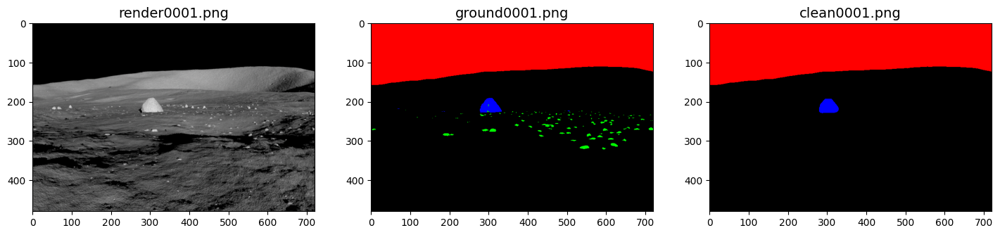

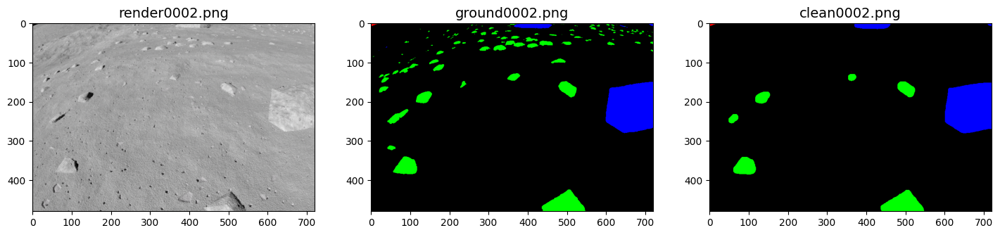

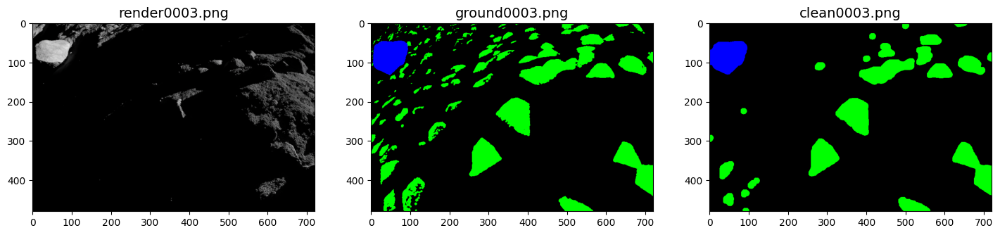

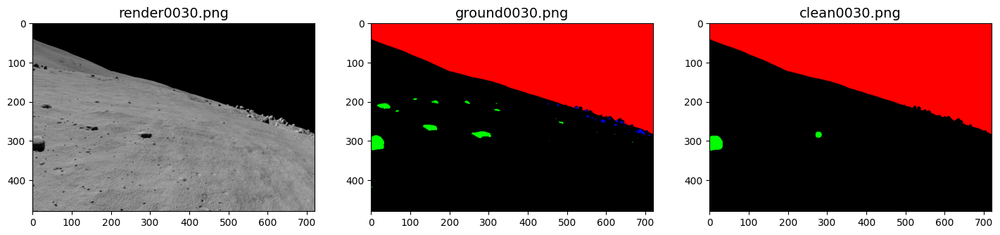

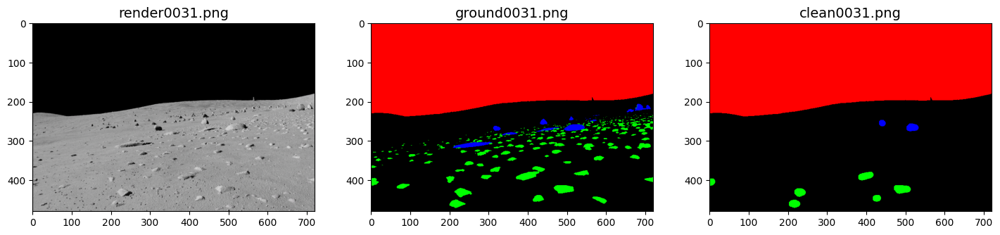

...

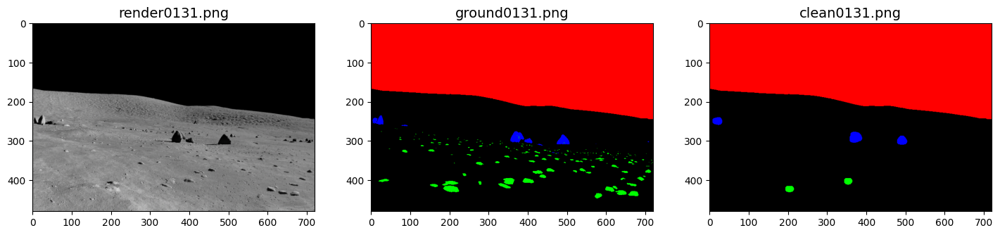

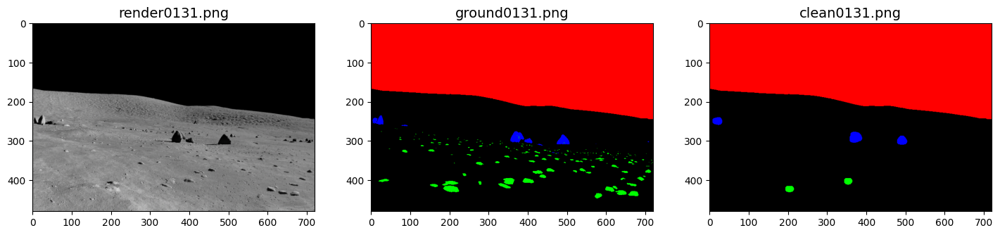

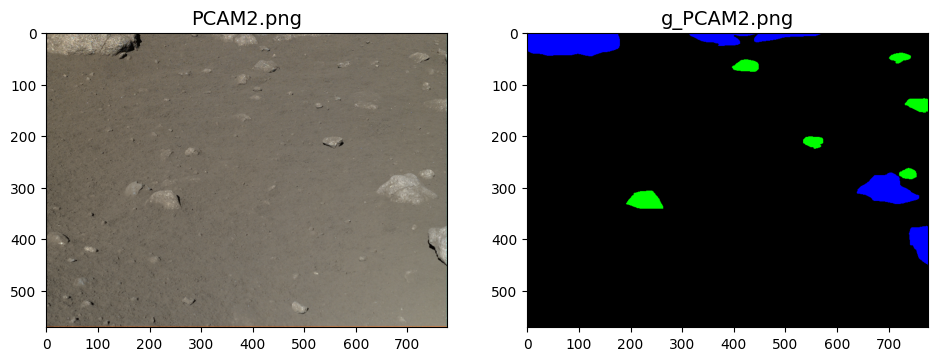

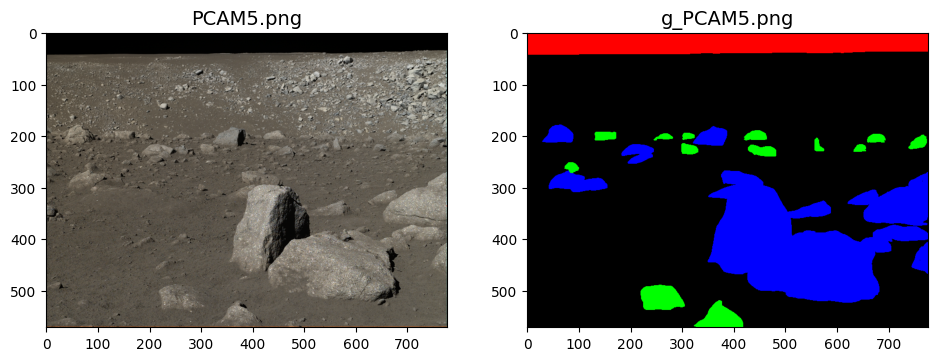

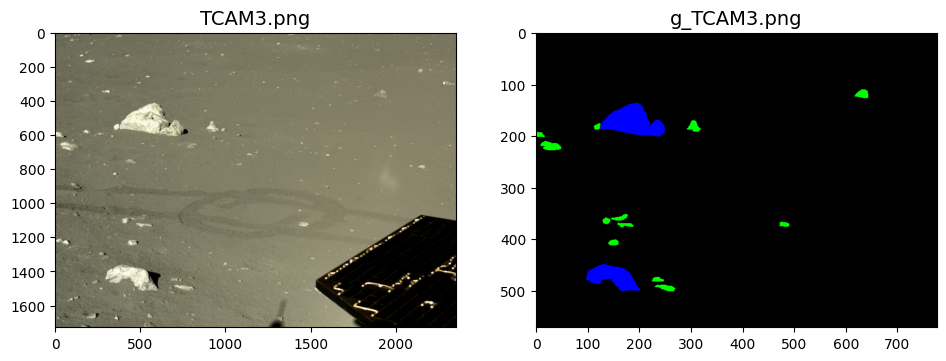

In [4]:
""" Visualize the synthetic raw data"""

#lets view the input data
print("Displaying raw synthetics images original render & mask paths:")
TRAIN_RENDER_DIR = DATA_DIR + "/images/train_render/" #training data
TRAIN_GROUND_MASK_DIR = DATA_DIR + "/images/train_ground/" #training masks
file_names= ['0001.png', '0002.png', '0003.png','0030.png','0031.png','0032.png','0130.png','0131.png','0131.png']
for file in file_names:
    plt.figure(figsize=(30,30))
    plt.subplot(5,5,1).set_title('render'+file, fontsize=14)
    img = cv2.imread(TRAIN_RENDER_DIR+'render'+file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    print(TRAIN_RENDER_DIR+'render'+file)
    plt.imshow(img)
    plt.subplot(5,5,1+1).set_title('ground'+file, fontsize=14)
    img = cv2.imread(TRAIN_GROUND_MASK_DIR+'ground'+file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.subplot(5,5,1+2).set_title('clean'+file, fontsize=14)
    img = cv2.imread(CLEAR_MASK_DIR+'clean'+file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)

"""visualize real raw moon images"""
print("Displaying raw real images:")
file_names= ['PCAM2.png','PCAM5.png', 'TCAM3.png']

for file in file_names:
    plt.figure(figsize=(30,30))
    plt.subplot(5,5,1).set_title(file, fontsize=14)
    print(REAL_MOON_IMAGES_DIR+file)
    img = cv2.imread(REAL_MOON_IMAGES_DIR+file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.subplot(5,5,1+1).set_title('g_'+file, fontsize=14)
    img = cv2.imread(REAL_MOON_IMAGES_DIR+'g_'+file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)



Displaying Test Augmented images:


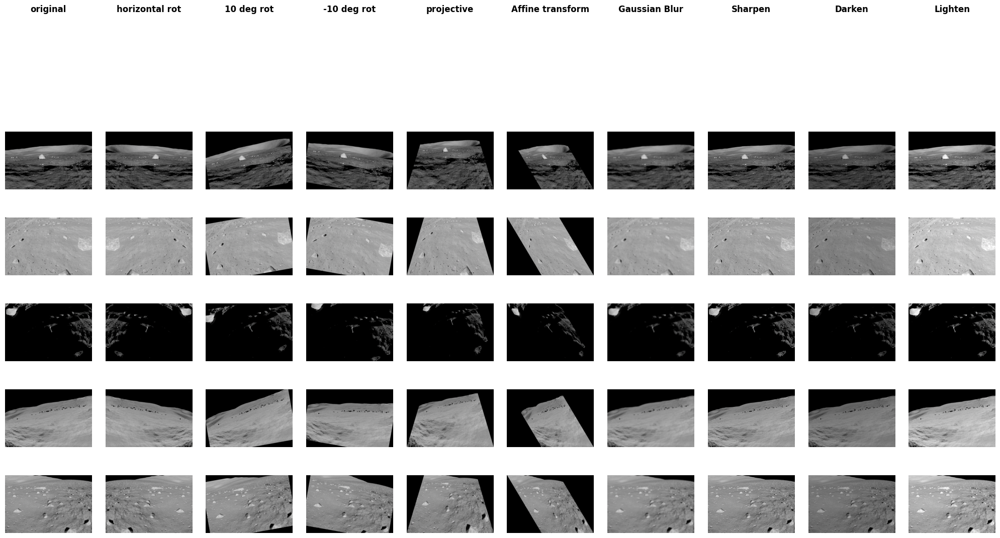

In [5]:
"""Test & visualize the augmentation using subset of the data.
Test & visualize some of the transforms so you can see that we need to take additional
steps in regards to rotations, perspectives, affines transforms when dealing with image segmentations"""
import cv2 as cv
import numpy as np
from PIL import Image
from multiprocessing import Pool
import math

#USE THESE DIRECTORIES FOR LOADING TRAINING, VALID, TEST, & FINAL FIELD TEST AFTER RUNNING THE NEXT CELL
#TRAINING DIRS
TRAIN_RENDER_DIR = DATA_DIR + "/images/train_render/" #training data
TRAIN_GROUND_MASK_DIR = DATA_DIR + "/images/train_ground/" #training masks
#VALID DIRS
VAILD_RENDER_DIR = DATA_DIR + "/images/valid_render/" #valid data
VALID_GROUND_MASK_DIR = DATA_DIR + "/images/valid_ground/" #valid masks
#TEST DIRS
TEST_RENDER_DIR = DATA_DIR + "/images/test_render/" #test data
TEST_GROUND_MASK_DIR = DATA_DIR + "/images/test_ground/" #test masks
#TEST DIRS
REAL_MOON_IMAGES_DIR= DATA_DIR+"/real_moon_images/" #FINAL DEPLOYMENT TEST
SUBSET_SIZE_VIZ = 10 #Just look at a subset for visualizing the transforms

# Augmentation functions
def test_augmentations(x):
    try:
        x = np.array(x, dtype=np.uint8)  # Ensure it is a NumPy array with the correct data type
        (h,w) = x.shape[:2] #width , height
        center = (w // 2, h // 2)  # Rotate around the image center
        if len(x.shape) == 2:  # If the image is grayscale, convert to 3 channels
            x = cv.cvtColor(x, cv.COLOR_GRAY2RGB)

        aug_X = []
        aug_X.append(x)  # Original image
        aug_X.append(cv.flip(x, 1))  # Horizontal flip
        #START -  counter clockwise rotations
        # start - rotate 10 degrees counter clock wise
        angle_deg = 10  # Counterclockwise rotation
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,1)
        rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        aug_X.append(rotated)
        # end - rotate 10 degrees counter clock wise
        #start - rotate 20
        # angle_deg = 20  # Counterclockwise rotation
        # rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,1)
        # rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        # aug_X.append(rotated)
        #end - rotate 20
        #start  - rotate 30
        # angle_deg = 30  # Counterclockwise rotation
        # rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,1)
        # rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        # aug_X.append(rotated)
        #end - rotate  30
        #END -  counter clockwise rotations
        #START -  counterwise  rotations
        #start - 10 degrees
        angle_deg = -10  # clockwise rotation
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,1)
        rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        aug_X.append(rotated)
        #nd - 10 degrees
        #start - 20 degrees
        # angle_deg = -20  # clockwise rotation
        # rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,1)
        # rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        # aug_X.append(rotated)
        # #end - 20 degrees
        # #start - 30 degrees
        # angle_deg = -30  # clockwise rotation
        # rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,1)
        # rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        # aug_X.append(rotated)
        #end - 30 degrees
        #END -  counterwise  rotations
        #Start - projective transformations
        #projected to trapezoid
        num_cols = w
        num_rows = h
        upper_horizontal_shirk_factor = 0.2 #how much to shrink the top from both sides
        src_points = np.float32([[0,0], [num_cols-1,0], [0,num_rows-1], [num_cols,num_rows-1]])
        dst_points = np.float32([[int(num_cols*upper_horizontal_shirk_factor),0], [num_cols-int(num_cols*upper_horizontal_shirk_factor),0], [0,num_rows-1], [num_cols,num_rows-1]])
        projective_matrix = cv2.getPerspectiveTransform(src_points, dst_points)
        img_projected = cv2.warpPerspective(x, projective_matrix, (num_cols,num_rows))
        aug_X.append(img_projected)
        #end - projective
        #Start - affine transformations
        src_points = np.float32([[0,0], [num_cols-1,0], [0,num_rows-1]])
        dst_points = np.float32([[0,0], [int(0.6*(num_cols-1)),0], [int(0.4*(num_cols-1)),num_rows-1]])
        matrix = cv2.getAffineTransform(src_points, dst_points)
        img_afftran = cv2.warpAffine(x, matrix, (num_cols,num_rows))
        aug_X.append(img_afftran)
        #end - affine transformations
        aug_X.append(cv.GaussianBlur(x, (15, 15), 0))  # Gaussian blur
        kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])  # Sharpen kernel
        aug_X.append(cv.filter2D(x, -1, kernel))  # Sharpen
        #darken by 5% - more than 5% was creating very dark images
        darker_img = np.clip(x* 0.8, 0, 255).astype(np.uint8)
        aug_X.append(darker_img)
        #lighten by 20%
        lighter_img = np.clip(x* 1.20, 0, 255).astype(np.uint8)
        aug_X.append(lighter_img)
        # Ensure the output stays in uint8 format
        for i in range(len(aug_X)):
          aug_X[i] = np.clip(aug_X[i], 0, 255).astype(np.uint8)
        return aug_X
    except Exception as e:
        print(f"An error occurred in augmentation_process_x: {e}")
        return []


# Ensure matching order
image_files = sorted([file for file in os.listdir(TRAIN_RENDER_DIR) if os.path.isfile(os.path.join(TRAIN_RENDER_DIR, file))])

#DEBUGING ONLY Of SUBSET
image_files = image_files[:SUBSET_SIZE_VIZ]

list_of_images = []
for img_path in image_files:
    img = Image.open(TRAIN_RENDER_DIR+img_path)
    list_of_images.append(img)

#process & visualize a subset
aug_X = []
for img in list_of_images:
    aug_X.extend(test_augmentations(img))

#visualize
print("Displaying Test Augmented images:")
column_names= ["original","horizontal rot","10 deg rot","-10 deg rot","projective","Affine transform","Gaussian Blur","Sharpen","Darken","Lighten"]
display_images_in_grid(aug_X, rows=5, cols=len(column_names),column_names=column_names)

del list_of_images
del aug_X



Displaying augmented images:


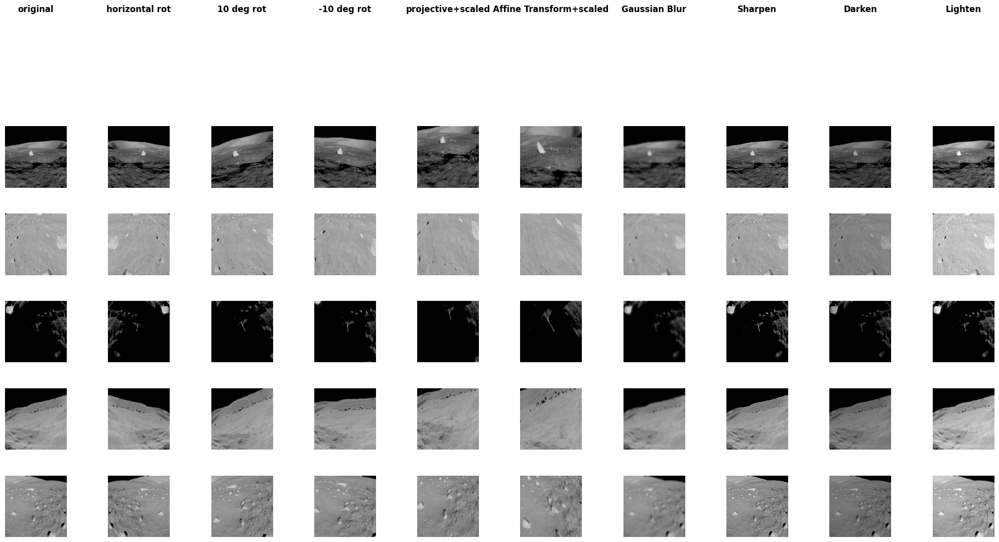

Displaying corresponding masks:


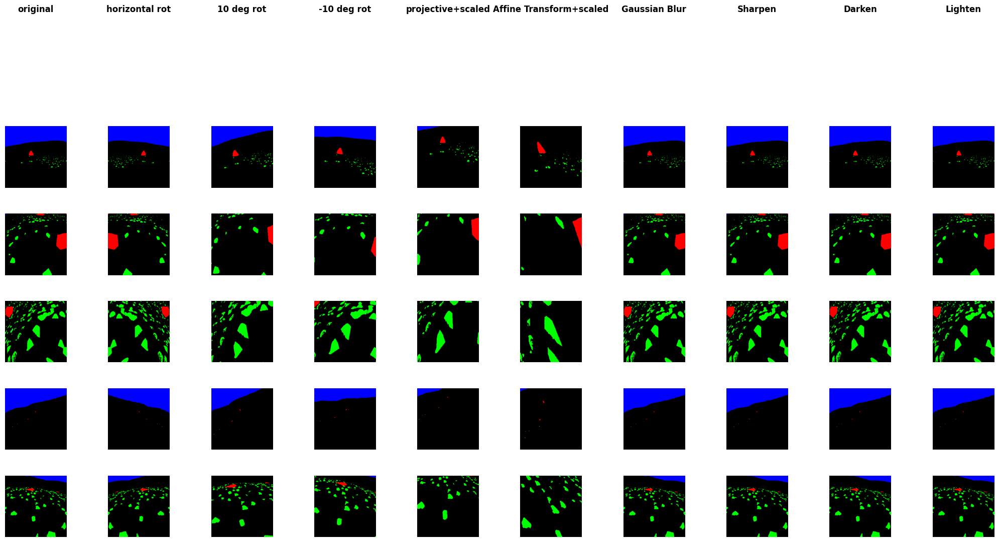

Train size: 19530
Test size: 978
Val size: 976


84539

In [6]:
import gc
import cv2 as cv
import numpy as np
from PIL import Image
from multiprocessing import Pool
import math
from scipy.spatial import cKDTree

"""Data Augmentation.
You may want to reduce number of augmentations or number of training samples since
in this code were doing all in memory operations in order to avois crashing.
"""

TRAIN_RENDER_DIR = DATA_DIR + "/images/train_render/" #training data
TRAIN_GROUND_MASK_DIR = DATA_DIR + "/images/train_ground/" #training masks

import numpy as np
import cv2
from scipy.spatial import cKDTree  # KDTree for fast nearest-neighbor search

#allowed colors
class_colors = [[0, 0, 0], [255, 0, 0], [0, 255, 0], [0, 0, 255]]

def fix_mask_rgb(mask_img):
    """
    Ensures the mask image contains ONLY the four class colors
    (Black, Red, Green, Blue) using a KDTree for fast lookup.

    Parameters:
      mask_img (np.array): Input mask image in BGR format.

    Returns:
      np.array: Updated mask image in BGR format containing only allowed colors.
    """

    # Define the strictly allowed class colors (in RGB format)
    class_colors = np.array([[0, 0, 0], [255, 0, 0], [0, 255, 0], [0, 0, 255]], dtype=np.uint8)

    # Convert the input image from BGR to RGB
    img_rgb = cv2.cvtColor(mask_img, cv2.COLOR_BGR2RGB)

    # Flatten the image into (num_pixels, 3) shape
    img_reshaped = img_rgb.reshape(-1, 3).astype(np.int16)  # Convert to int16 to prevent overflow

    # Build a KDTree for fast color matching
    tree = cKDTree(class_colors.astype(np.int16))

    # Find the nearest allowed color for each pixel
    _, nearest_indices = tree.query(img_reshaped)

    # Strictly enforce the 4-class rule: Assign only valid colors
    img_fixed = class_colors[nearest_indices].reshape(img_rgb.shape).astype(np.uint8)

    # Convert the fixed image back to BGR format
    img_bgr = cv2.cvtColor(img_fixed, cv2.COLOR_RGB2BGR)

    # ** Debugging: Check Unique Colors in Output **
    unique_colors = np.unique(img_fixed.reshape(-1, 3), axis=0)
    #print("Unique Colors in Output (Should be exactly 4):\n", unique_colors)

    return img_bgr


"""Functions related to augmentation"""
# Augmentation functions
def augmentation_process_x(x):
    try:

        x = np.array(x, dtype=np.uint8)  # Ensure it is a NumPy array with the correct data type
        x = cv2.resize(x, (IMG_HEIGHT,IMG_WIDTH), interpolation=cv2.INTER_AREA) #resize
        (h,w) = x.shape[:2] #width , height
        center = (w // 2, h // 2)  # Rotate around the image center
        if len(x.shape) == 2:  # If the image is grayscale, convert to 3 channels
            x = cv.cvtColor(x, cv.COLOR_GRAY2RGB)

        aug_X = []
        aug_X.append(x)  # Original image
        aug_X.append(cv.flip(x, 1))  # Horizontal flip
        #START -  counter clockwise rotations
        # start - rotate 10 degrees counter clock wise
        angle_deg = 10  # Counterclockwise rotation
        scale_10_degree_rotation = 1.25
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_10_degree_rotation)
        rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        aug_X.append(rotated)
        # end - rotate 10 degrees counter clock wise
        #start - rotate 20
        # angle_deg = 20  # Counterclockwise rotation
        # scale_20_degree_rotation = 1.50
        # rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_20_degree_rotation)
        # rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        # aug_X.append(rotated)
        # #end - rotate 20
        # #start  - rotate 30
        # angle_deg = 30  # Counterclockwise rotation
        # scale_30_degree_rotation = 1.75
        # rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_30_degree_rotation)
        # rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        # aug_X.append(rotated)
        #end - rotate  30
        #END -  counter clockwise rotations
        #START -  counterwise  rotations
        #start - 10 degrees
        angle_deg = -10  # clockwise rotation
        scale_10_degree_rotation = 1.25
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_10_degree_rotation)
        rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        aug_X.append(rotated)
        #nd - 10 degrees
        #start - 20 degrees
        # angle_deg = -20  # clockwise rotation
        # scale_20_degree_rotation = 1.50
        # rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_20_degree_rotation)
        # rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        # aug_X.append(rotated)
        # #end - 20 degrees
        # #start - 30 degrees
        # angle_deg = -30  # clockwise rotation
        # scale_30_degree_rotation = 1.75
        # rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_20_degree_rotation)
        # rotated = cv2.warpAffine(x, rotation_matrix, (w, h))
        # aug_X.append(rotated)
        #end - 30 degrees
        #END -  counterwise  rotations
        #Start - projective transformations
        #projected to trapezoid
        num_cols = w
        num_rows = h
        upper_horizontal_shirk_factor = 0.2 #how much to shrink the top from both sides
        src_points = np.float32([[0,0], [num_cols-1,0], [0,num_rows-1], [num_cols,num_rows-1]])
        dst_points = np.float32([[int(num_cols*upper_horizontal_shirk_factor),0], [num_cols-int(num_cols*upper_horizontal_shirk_factor),0], [0,num_rows-1], [num_cols,num_rows-1]])
        projective_matrix = cv2.getPerspectiveTransform(src_points, dst_points)
        img_projected = cv2.warpPerspective(x, projective_matrix, (num_cols,num_rows))
        #resize due to distortion
        rotation_matrix = cv2.getRotationMatrix2D(center, 0,1.55) #top was shrunck which adds black areas that need to be removed
        img_projected_scaled = cv2.warpAffine(img_projected, rotation_matrix, (w, h))
        aug_X.append(img_projected_scaled)
        #end - projective
        #Start - affine transformations
        src_points = np.float32([[0,0], [num_cols-1,0], [0,num_rows-1]])
        dst_points = np.float32([[0,0], [int(0.6*(num_cols-1)),0], [int(0.4*(num_cols-1)),num_rows-1]])
        matrix = cv2.getAffineTransform(src_points, dst_points)
        img_afftran = cv2.warpAffine(x, matrix, (num_cols,num_rows))
        #resize due to distortion
        rotation_matrix = cv2.getRotationMatrix2D(center, 0,2.4) #top was shrunck which adds black areas that need to be removed
        img_afftran = cv2.warpAffine(img_afftran, rotation_matrix, (w, h))
        aug_X.append(img_afftran)
        #end - affine transformations
        aug_X.append(cv.GaussianBlur(x, (15, 15), 0))  # Gaussian blur
        kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])  # Sharpen kernel
        aug_X.append(cv.filter2D(x, -1, kernel))  # Sharpen
        #darken by 15% - more than 15% was creating very dark images
        darker_img = np.clip(x* 0.8, 0, 255).astype(np.uint8)
        aug_X.append(darker_img)
        #lighten by 20%
        lighter_img = np.clip(x* 1.20, 0, 255).astype(np.uint8)
        aug_X.append(lighter_img)
        # Ensure the output stays in uint8 format
        for i in range(len(aug_X)):
          aug_X[i] = np.clip(aug_X[i], 0, 255).astype(np.uint8)
        return aug_X
    except Exception as e:
        print(f"An error occurred in augmentation_process_x: {e}")
        return []

"""Augmentation for masks"""
def augmentation_process_y(y):
    try:

        y = np.array(y, dtype=np.uint8)  # Ensure it is a NumPy array with the correct data type
        resized_y = cv2.resize(y, (IMG_HEIGHT,IMG_WIDTH), interpolation=cv2.INTER_AREA) #resize
        fixed_mask = fix_mask_rgb(mask_img=resized_y) #rbg must only be from allowed values=number of classes
        y = fixed_mask
        (h,w) = y.shape[:2] #width , height
        center = (w // 2, h // 2)
        if len(y.shape) == 2:  # Single-channel image
            y = np.expand_dims(y, axis=-1)  # Add a channel dimension if missing

        aug_Y = []
        aug_Y.append(y)  # Original mask
        aug_Y.append(cv.flip(y, 1))  # Horizontal flip
        #START -  counter clockwise rotations
        # start - rotate 10 degrees counter clock wise
        angle_deg = 10  # Counterclockwise rotation
        scale_10_degree_rotation = 1.30
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_10_degree_rotation)
        rotated = cv2.warpAffine(y, rotation_matrix, (w, h))
        aug_Y.append(fix_mask_rgb(rotated)) #need fix mask again after openCV rotations,perspective,and affine
        # end - rotate 10 degrees counter clock wise
        # start - 20 deg counter clock
        # angle_deg = 20  # Counterclockwise rotation
        # scale_20_degree_rotation = 1.55
        # rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_20_degree_rotation)
        # rotated = cv2.warpAffine(y, rotation_matrix, (w, h))
        # aug_Y.append(rotated)
        # # end - 20 deg counter clock
        # # start - 30 deg counter clock
        # angle_deg = 30  # Counterclockwise rotation
        # scale_30_degree_rotation = 1.80
        # rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_30_degree_rotation)
        # rotated = cv2.warpAffine(y, rotation_matrix, (w, h))
        # aug_Y.append(rotated)
        # end - 30 deg counter clock
        #END -  counter clockwise rotations
        #START -  counterwise  rotations
        #start - 10 degerees
        angle_deg = -10  # clockwise rotation
        scale_10_degree_rotation = 1.30
        rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_10_degree_rotation)
        rotated = cv2.warpAffine(y, rotation_matrix, (w, h))
        aug_Y.append(fix_mask_rgb(rotated))
        #end - 10 degrees
        #start - 20 degrees
        # angle_deg = -20  # clockwise rotation
        # scale_20_degree_rotation = 1.55
        # rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_20_degree_rotation)
        # rotated = cv2.warpAffine(y, rotation_matrix, (w, h))
        # aug_Y.append(rotated)
        # #end - 20 degrees
        # #start - 30 degrees
        # angle_deg = -30  # clockwise rotation
        # scale_30_degree_rotation = 1.80
        # rotation_matrix = cv2.getRotationMatrix2D(center, angle_deg,scale_30_degree_rotation)
        # rotated = cv2.warpAffine(y, rotation_matrix, (w, h))
        # aug_Y.append(rotated)
        #end - 30 degrees
        #END -  counterwise  rotations
        #projected to trapezoid
        num_cols = w
        num_rows = h
        upper_horizontal_shirk_factor = 0.2 #how much to shrink the top from both sides
        src_points = np.float32([[0,0], [num_cols-1,0], [0,num_rows-1], [num_cols,num_rows-1]])
        dst_points = np.float32([[int(num_cols*upper_horizontal_shirk_factor),0], [num_cols-int(num_cols*upper_horizontal_shirk_factor),0], [0,num_rows-1], [num_cols,num_rows-1]])
        projective_matrix = cv2.getPerspectiveTransform(src_points, dst_points)
        img_projected = cv2.warpPerspective(y, projective_matrix, (num_cols,num_rows))
        #resize due to distortion
        rotation_matrix = cv2.getRotationMatrix2D(center, 0,1.55) #top was shrunck which adds black areas that need to be removed
        img_projected_scaled = cv2.warpAffine(img_projected, rotation_matrix, (w, h))
        aug_Y.append(fix_mask_rgb(img_projected_scaled))
        #end - projective
        #Start - affine transformations
        src_points = np.float32([[0,0], [num_cols-1,0], [0,num_rows-1]])
        dst_points = np.float32([[0,0], [int(0.6*(num_cols-1)),0], [int(0.4*(num_cols-1)),num_rows-1]])
        matrix = cv2.getAffineTransform(src_points, dst_points)
        img_afftran = cv2.warpAffine(y, matrix, (num_cols,num_rows))
        #resize due to distortion
        rotation_matrix = cv2.getRotationMatrix2D(center, 0,2.4) #top was shrunck which adds black areas that need to be removed
        img_afftran = cv2.warpAffine(img_afftran, rotation_matrix, (w, h))
        aug_Y.append(fix_mask_rgb(img_afftran))
        #end - affine transformations
        aug_Y.append(y)  # Keep original for blur
        aug_Y.append(y)  # Keep original for sharpen
        aug_Y.append(y)  # Keep original for darken
        aug_Y.append(y)  # Keep original for lighter
        for i in range(len(aug_Y)):
          aug_Y[i] = np.clip(aug_Y[i], 0, 255).astype(np.uint8)
        return aug_Y
    except Exception as e:
        print(f"An error occurred in augmentation_process_y: {e}")
        return []


# Function to process each image pair & return augmented list
def process_image_pair(img_path, mask_path):
    try:
        img = Image.open(img_path)
        mask = Image.open(mask_path)
        return augmentation_process_x(img), augmentation_process_y(mask)
    except Exception as e:
        print("process_image_pair(), Error img_path:", img_path)
        print("process_image_pair(), Error mask_path:", mask_path)
        print(f"Error in process_image_pair: {e}")
        return [], []

def process_wrapper(img_mask_pair):
    img_path, mask_path = img_mask_pair
    return process_image_pair(img_path, mask_path)



# Ensure matching order
image_files = sorted([file for file in os.listdir(TRAIN_RENDER_DIR) if os.path.isfile(os.path.join(TRAIN_RENDER_DIR, file))])
mask_files = sorted([file for file in os.listdir(TRAIN_GROUND_MASK_DIR) if os.path.isfile(os.path.join(TRAIN_GROUND_MASK_DIR, file))])

"""WARNING!. This train_dataset is too large for Collab so subset it to 15% of the data only
or else it might crash the notbook."""
TRAINING_SUBSET_LIMIT = int(len(mask_files)*0.25)

# Ensure equal length
if len(image_files) != len(mask_files):
    print("Warning: TRAIN_RENDER_DIR and TRAIN_GROUND_MASK_DIR do not have the same number of files!")
    print("len(image_files):",len(image_files))
    print("len(mask_files):",len(mask_files))

# Construct full paths
image_paths = [os.path.join(TRAIN_RENDER_DIR, file) for file in image_files]
mask_paths = [os.path.join(TRAIN_GROUND_MASK_DIR, file) for file in mask_files]

augmented_X = []
augmented_Y = []

#NOTE: we used a subset! Due to memory
image_paths = image_paths[0:TRAINING_SUBSET_LIMIT]
mask_paths = mask_paths[0:TRAINING_SUBSET_LIMIT]

#run in multithreaded way
with Pool(processes=8) as pool:
    results = pool.map(process_wrapper, zip(image_paths, mask_paths))

#add intermediate sublists back to original
for aug_img_list, aug_mask_list in results:
    augmented_X.extend(aug_img_list)
    augmented_Y.extend(aug_mask_list)

# Step 3: Display augmented images and masks
print("Displaying augmented images:")
column_names= ["original","horizontal rot","10 deg rot","-10 deg rot","projective+scaled","Affine Transform+scaled","Gaussian Blur","Sharpen","Darken","Lighten"]
display_images_in_grid(augmented_X, rows=5, cols=len(column_names),column_names=column_names) #Note: cols= NUMBER of augmentations

print("Displaying corresponding masks:")
display_images_in_grid(augmented_Y, rows=5, cols=len(column_names),column_names=column_names)  #Note: cols= NUMBER of augmentations


#load from augmented list
train_dataset = LunarRocksDatasetFromArray(augmented_X,augmented_Y,INPUT_WIDTH=IMG_WIDTH,INPUT_HEIGHT=IMG_HEIGHT,limit=None)
#load from VALIDATION DIR - This insures the augmentations are not mixed within train, test, and validation tests
val_dataset = LunarRocksDatasetFromDrive(VAILD_RENDER_DIR,VALID_GROUND_MASK_DIR,INPUT_WIDTH=IMG_WIDTH,INPUT_HEIGHT=IMG_HEIGHT )
#load from test DIR - This insures the augmentations are not mixed within train, test, and validation tests
test_dataset = LunarRocksDatasetFromDrive(TEST_RENDER_DIR,TEST_GROUND_MASK_DIR,INPUT_WIDTH=IMG_WIDTH,INPUT_HEIGHT=IMG_HEIGHT )

print(f"Train size: {len(train_dataset)}")
print(f"Test size: {len(test_dataset)}")
print(f"Val size: {len(val_dataset)}")
#cleanup
del augmented_X
del augmented_Y
del image_paths
del mask_paths
del results
gc.collect()

*Mean K-means Dice & IoU Scores:
k=3, Class Ground Surface, Dice = 0.9829, IoU = 0.9673
k=3, Class Sky, Dice = 0.0000, IoU = 0.0000
k=3, Class Small Rocks, Dice = 0.0000, IoU = 0.0000
k=3, Class Large Rocks, Dice = 0.0000, IoU = 0.0000


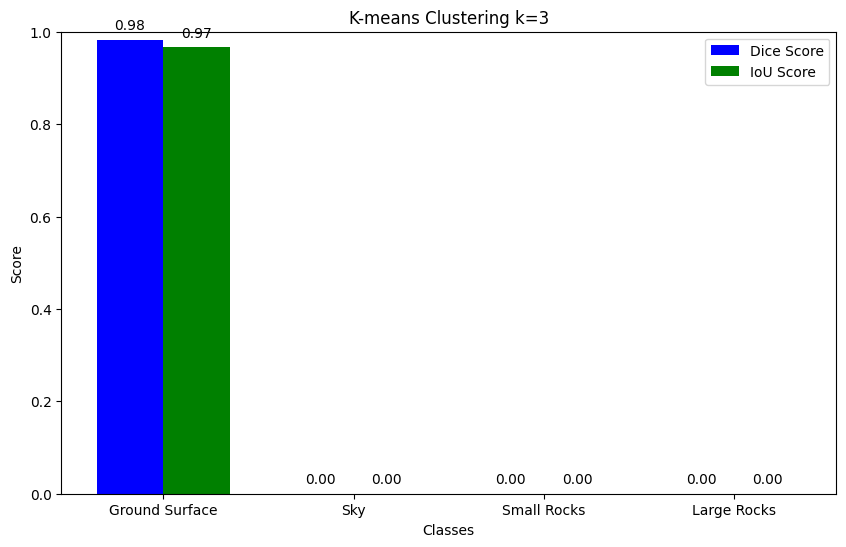

Best Overall (All Classes) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
*Mean K-means Dice & IoU Scores:
k=4, Class Ground Surface, Dice = 0.9829, IoU = 0.9673
k=4, Class Sky, Dice = 0.0000, IoU = 0.0000
k=4, Class Small Rocks, Dice = 0.0000, IoU = 0.0000
k=4, Class Large Rocks, Dice = 0.0000, IoU = 0.0000


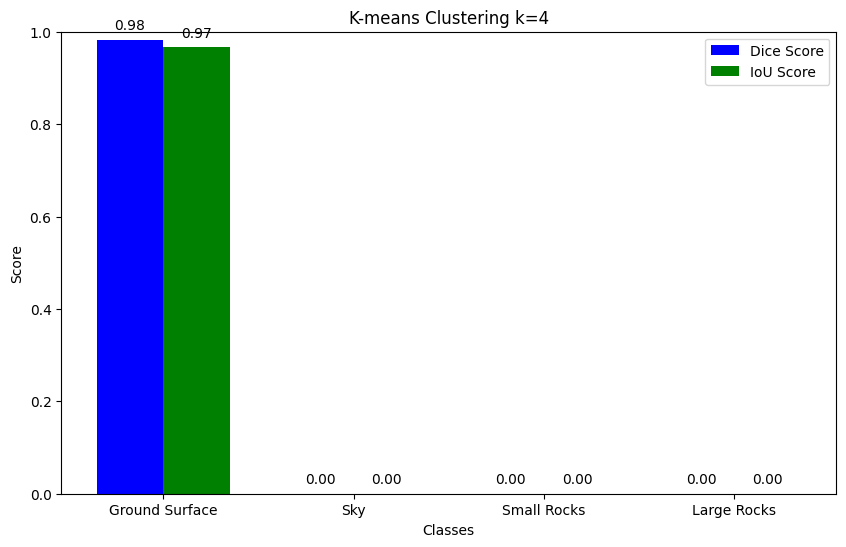

Best Overall (All Classes) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
*Mean K-means Dice & IoU Scores:
k=5, Class Ground Surface, Dice = 0.9829, IoU = 0.9673
k=5, Class Sky, Dice = 0.0000, IoU = 0.0000
k=5, Class Small Rocks, Dice = 0.0000, IoU = 0.0000
k=5, Class Large Rocks, Dice = 0.0000, IoU = 0.0000


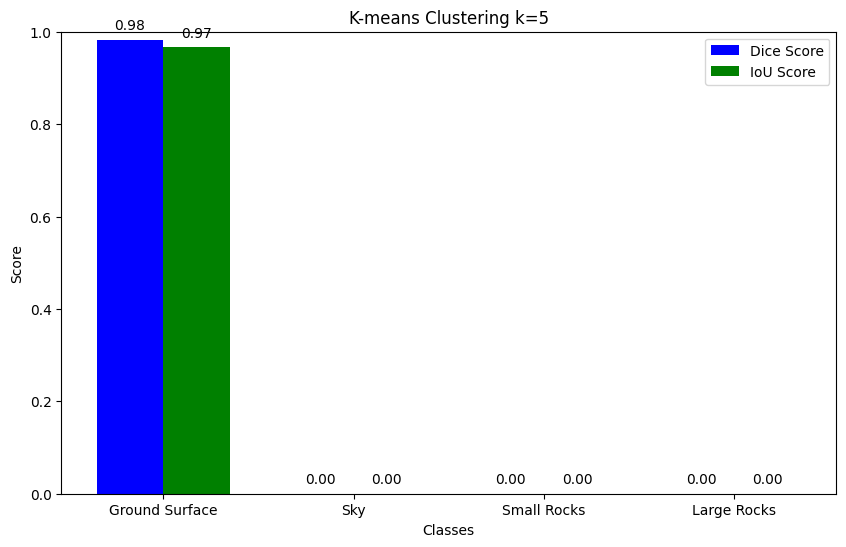

Best Overall (All Classes) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
*Mean K-means Dice & IoU Scores:
k=6, Class Ground Surface, Dice = 0.9829, IoU = 0.9673
k=6, Class Sky, Dice = 0.0000, IoU = 0.0000
k=6, Class Small Rocks, Dice = 0.0000, IoU = 0.0000
k=6, Class Large Rocks, Dice = 0.0000, IoU = 0.0000


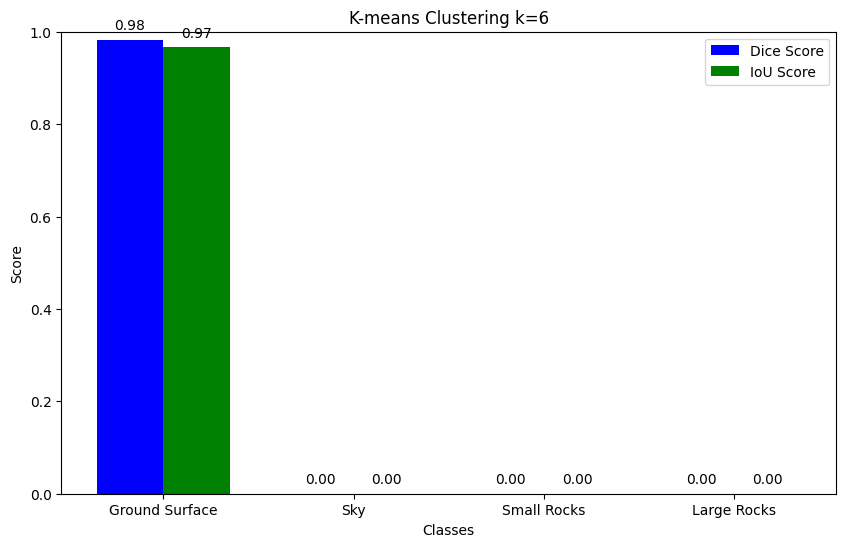

Best Overall (All Classes) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
*Mean K-means Dice & IoU Scores:
k=7, Class Ground Surface, Dice = 0.9829, IoU = 0.9673
k=7, Class Sky, Dice = 0.0000, IoU = 0.0000
k=7, Class Small Rocks, Dice = 0.0000, IoU = 0.0000
k=7, Class Large Rocks, Dice = 0.0000, IoU = 0.0000


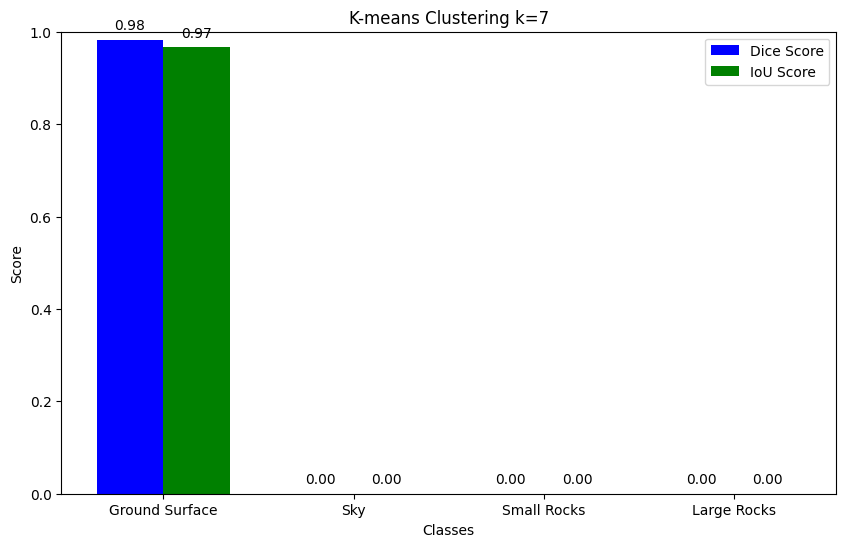

Best Overall (All Classes) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
*Mean K-means Dice & IoU Scores:
k=8, Class Ground Surface, Dice = 0.9829, IoU = 0.9673
k=8, Class Sky, Dice = 0.0000, IoU = 0.0000
k=8, Class Small Rocks, Dice = 0.0000, IoU = 0.0000
k=8, Class Large Rocks, Dice = 0.0000, IoU = 0.0000


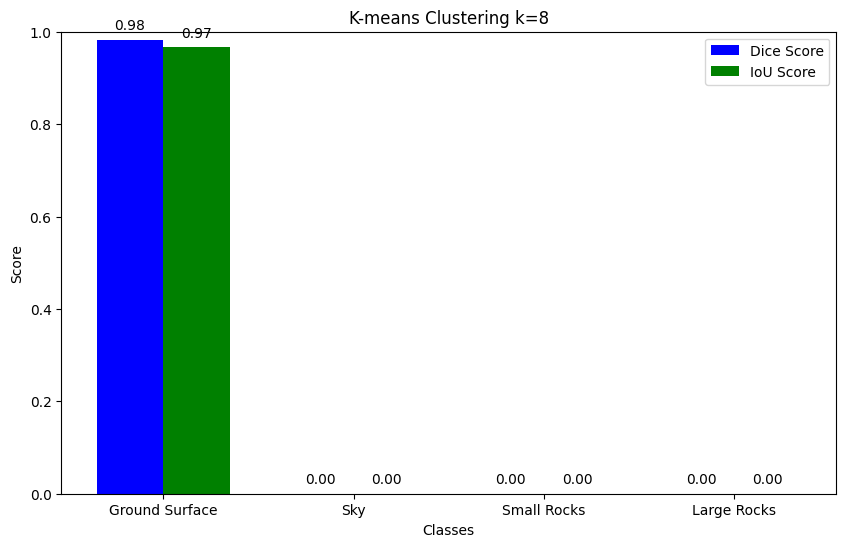

Best Overall (All Classes) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
Best Surface objects (No Sky) k=3, Best Mean Dice=0.982941189011262, Best Mean IoU=0.9672638888860903
drive/MyDrive/ECE551/kaggle_lunar_images/images/render/render0001.png
drive/MyDrive/ECE551/kaggle_lunar_images/images/render/render0002.png
drive/MyDrive/ECE551/kaggle_lunar_images/images/render/render0003.png
drive/MyDrive/ECE551/kaggle_lunar_images/images/render/render0030.png
drive/MyDrive/ECE551/kaggle_lunar_images/images/render/render0031.png
drive/MyDrive/ECE551/kaggle_lunar_images/images/render/render0032.png
drive/MyDrive/ECE551/kaggle_lunar_images/images/render/render0130.png
dri

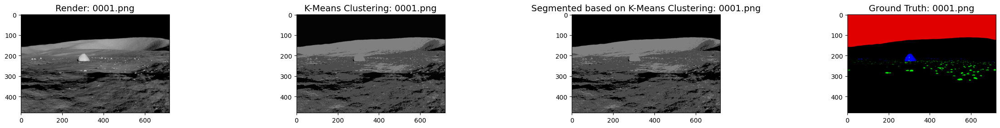

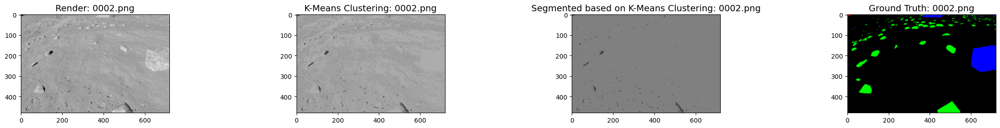

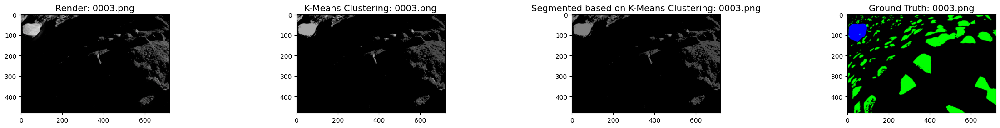

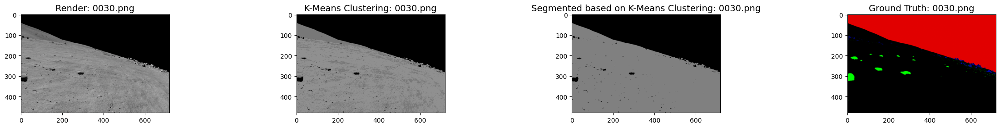

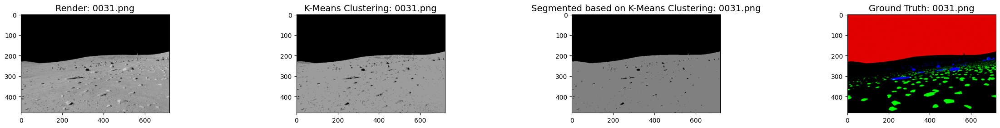

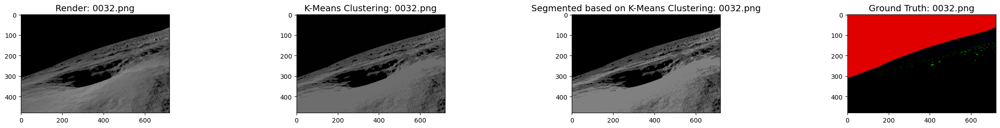

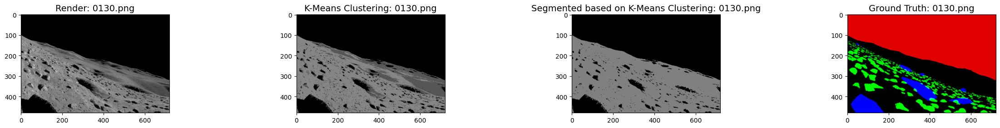

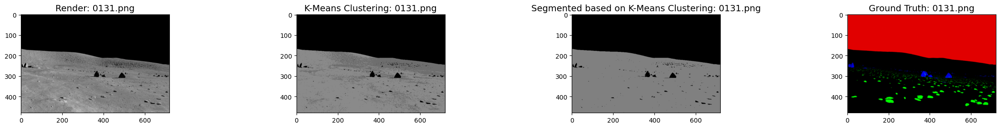

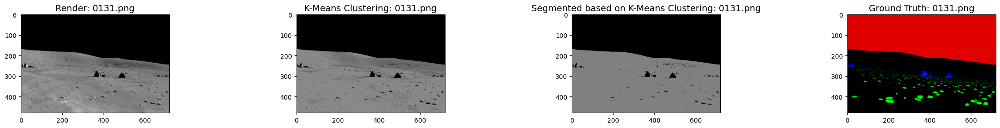

In [ ]:
"""OPTIONAL - Run K-means as exploratory method - START"""
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import numpy as np
import random
import cv2 as cv

# Compute mean Dice and IoU for each class & generate a bar plot
def compute_mean_scores(k: int, class_names: dict, total_dice_scores: dict, total_iou_scores: dict, num_images: int):
    try:

        mean_dice_scores = []
        mean_iou_scores = []
        labels = []

        print("*Mean K-means Dice & IoU Scores:")
        for label in total_dice_scores:
            mean_dice = total_dice_scores[label] / num_images
            mean_iou = total_iou_scores[label] / num_images
            print(f"k={k}, Class {class_names[label]}, Dice = {mean_dice:.4f}, IoU = {mean_iou:.4f}")

            # Append values for plotting
            labels.append(class_names[label])
            mean_dice_scores.append(mean_dice)
            mean_iou_scores.append(mean_iou)

        # Define bar positions
        x = np.arange(len(labels))  # Class indices
        width = 0.35  # Width of bars

        # Create the plot
        fig, ax = plt.subplots(figsize=(10, 6))
        bars1 = ax.bar(x - width/2, mean_dice_scores, width, label='Dice Score', color='blue')
        bars2 = ax.bar(x + width/2, mean_iou_scores, width, label='IoU Score', color='green')

        # Add labels & formatting
        ax.set_xlabel("Classes")
        ax.set_ylabel("Score")
        ax.set_title(f"K-means Clustering k={k}")
        ax.set_xticks(x)
        ax.set_xticklabels(labels)
        ax.set_ylim(0.0, 1.0)  # Ensure y-axis is between 0-1
        ax.legend()

        # Add value labels on top of bars
        for bars, scores in zip([bars1, bars2], [mean_dice_scores, mean_iou_scores]):
            for bar, score in zip(bars, scores):
                height = bar.get_height()
                ax.annotate(f'{score:.2f}',
                            xy=(bar.get_x() + bar.get_width() / 2, height),
                            xytext=(0, 5),  # Offset above bar
                            textcoords="offset points",
                            ha='center', va='bottom', fontsize=10, color='black')

        # Show plot
        plt.show()

    except Exception as e:
        print(f"An error occurred in compute_mean_scores: {e}")
        print("k=", k)


subset_size = 30
# Print Dice and IoU for each class
class_names = {0: "Ground Surface", 1: "Sky", 2: "Small Rocks", 3: "Large Rocks"}
TRAIN_DIR = TRAIN_RENDER_DIR
TRAIN_MASK_DIR = TRAIN_GROUND_MASK_DIR

train_images_for_k_means = [os.path.join(TRAIN_DIR, f) for f in os.listdir(TRAIN_DIR) if f.endswith('.png')]
mask_images_for_k_means = [os.path.join(TRAIN_MASK_DIR, f) for f in os.listdir(TRAIN_MASK_DIR) if f.endswith('.png')]

# Sort lists to ensure matching order of images and masks
train_images_for_k_means.sort()
mask_images_for_k_means.sort()

train_images_for_k_means = train_images_for_k_means[:subset_size]
mask_images_for_k_means = mask_images_for_k_means[:subset_size]

# Initialize totals for averaging
total_dice_scores = {0: 0, 1: 0, 2: 0, 3: 0}
total_iou_scores = {0: 0, 1: 0, 2: 0, 3: 0}
best_k = 0
max_dice = 0
max_iou = 0
clusters = [3,4,5,6,7,8]
for k in clusters:
  total_dice_scores = {0: 0, 1: 0, 2: 0, 3: 0}
  total_iou_scores = {0: 0, 1: 0, 2: 0, 3: 0}
  # Process each image-mask pair
  for image_path, mask_path in zip(train_images_for_k_means,mask_images_for_k_means):
      dice_scores, iou_scores = evaluate_multiclass_segmentation(image_path, mask_path, color_map,attempted_accuracy=0.85, k=k)

      for label in dice_scores:
          total_dice_scores[label] += dice_scores[label]
          total_iou_scores[label] += iou_scores[label]
  compute_mean_scores(k,class_names, total_dice_scores, total_iou_scores, len(train_images_for_k_means))
  #compare the combined avg dice & avg iou per k, in  order to pikc the best k.
  for label in dice_scores:
    if (total_dice_scores[label]/len(train_images_for_k_means))+(total_iou_scores[label]/len(train_images_for_k_means)) > max_dice+max_iou:
      max_dice = total_dice_scores[label]/len(train_images_for_k_means)
      max_iou = total_iou_scores[label]/len(train_images_for_k_means)
      best_k = k

  print(f"Best Overall (All Classes) k={best_k}, Best Mean Dice={max_dice}, Best Mean IoU={max_iou}")

  #compare the combined avg dice & avg iou per k, in  order to pikc the best k.
  for label in dice_scores:
    if label != 1: #exlucde the sky
      if (total_dice_scores[label]/len(train_images_for_k_means))+(total_iou_scores[label]/len(train_images_for_k_means)) > max_dice+max_iou:
        max_dice = total_dice_scores[label]/len(train_images_for_k_means)
        max_iou = total_iou_scores[label]/len(train_images_for_k_means)
        best_k = k

    print(f"Best Surface objects (No Sky) k={best_k}, Best Mean Dice={max_dice}, Best Mean IoU={max_iou}")


file_names= ['0001.png', '0002.png', '0003.png','0030.png','0031.png','0032.png','0130.png','0131.png','0131.png']

"""apply k-means clustering on rendered input images with optimal k."""
for file_name in file_names:
    plt.figure(figsize=(30, 30))
    n_rows = len(file_names)
    # Rendered Image
    plt.subplot(n_rows, 4, 1).set_title('Render: ' + file_name, fontsize=14)
    img = cv2.imread(TRAIN_DIR + 'render' + file_name)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    print(TRAIN_DIR + 'render' + file_name)
    plt.imshow(img)

    # Visualize K-Means Segmented Image (Only show Ground & Sky in their original colors)
    plt.subplot(n_rows,4, 2).set_title('K-Means Clustering: ' + file_name, fontsize=14)
    k_means_segmented = k_means_clustering(TRAIN_DIR + 'render' + file_name, 0.85, k=best_k)
    plt.imshow(k_means_segmented)

    # Third column: keep black as black, all other colors as grey
    plt.subplot(n_rows, 4, 3).set_title('Segmented based on K-Means Clustering: ' + file_name, fontsize=14)

    mod_k_means_segmented = k_means_segmented.copy()
    # Loop through each pixel to check for shades of grey and black
    for i in range(mod_k_means_segmented.shape[0]):
        for j in range(mod_k_means_segmented.shape[1]):
            pixel = mod_k_means_segmented[i, j]

            # Define tolerance for black and grey shades
            black_tolerance = 50  # Allow slight variation for black pixels
            grey_tolerance = 50   # Allow slight variation for grey pixels

            # Check if the pixel is close to black (any shade of black)
            if np.allclose(pixel, [0, 0, 0], atol=black_tolerance):  # If it's black
                mod_k_means_segmented[i, j] = [0, 0, 0]

            # Check if the pixel is close to grey (any shade of grey)
            elif np.allclose(pixel, [128, 128, 128], atol=grey_tolerance):  # If it's grey
                mod_k_means_segmented[i, j] = [128, 128, 128]

            # Otherwise leave the pixel as is
            else:
                pass

    plt.imshow(mod_k_means_segmented)

    # Ground Truth Mask (Visualize true labels)
    plt.subplot(n_rows, 4, 4).set_title('Ground Truth: ' + file_name, fontsize=14)
    img = cv2.imread(TRAIN_MASK_DIR + 'ground' + file_name)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)

# """Run k-means as exploratory method - END"""



In [7]:
"""Load data for trainig & Define Model Architecture"""
import torch

print(f"Train size: {len(train_dataset)}")
print(f"Test size: {len(test_dataset)}")
print(f"Val size: {len(val_dataset)}")

BATCH_SIZE =  4
#Note: entire train_dataset is ~Train size: 78,000 we reduced it ~15,000 to prevent a crash in Collab
train_dataloader = DataLoader(dataset=train_dataset,
                              num_workers=num_workers, pin_memory=False,
                              batch_size=BATCH_SIZE,
                              shuffle=True)

val_dataloader = DataLoader(dataset=val_dataset,
                            num_workers=num_workers, pin_memory=False,
                            batch_size=BATCH_SIZE,
                            shuffle=True)

test_dataloader = DataLoader(dataset=test_dataset,
                            num_workers=num_workers, pin_memory=False,
                            batch_size=BATCH_SIZE,
                            shuffle=True)



Train size: 19530
Test size: 978
Val size: 976


<ipython-input-13-642e1c86edb1>:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


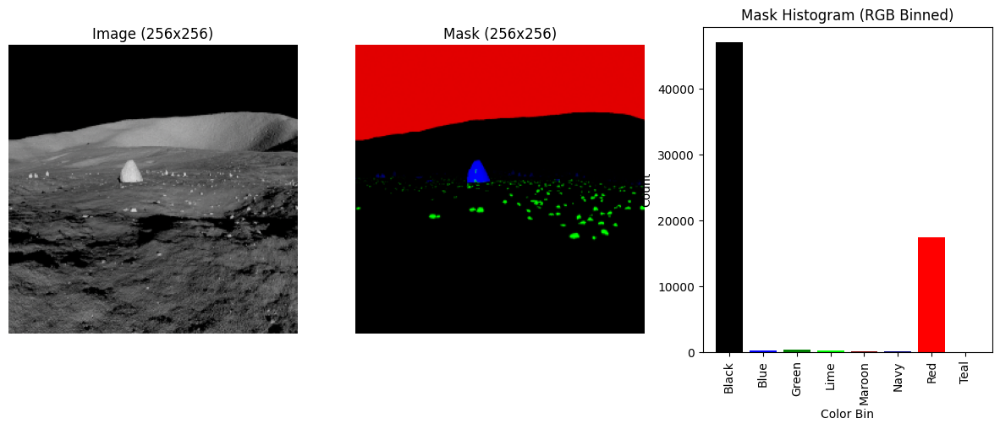

<ipython-input-13-642e1c86edb1>:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


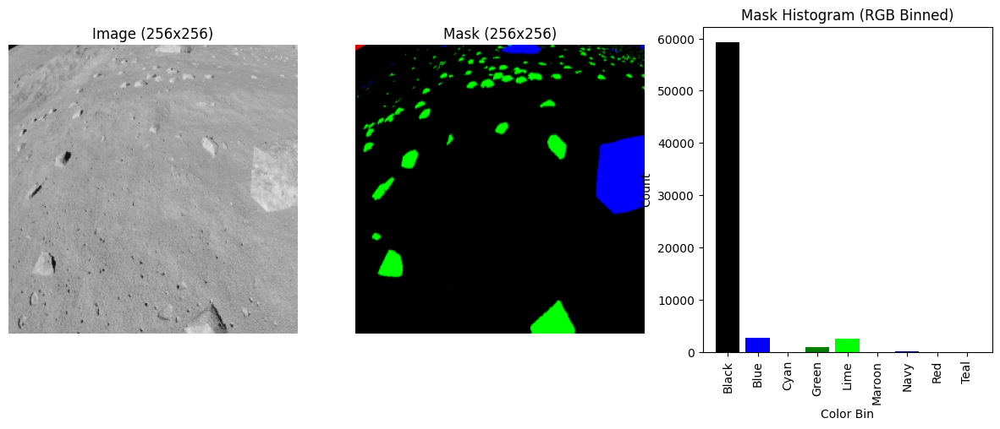

<ipython-input-13-642e1c86edb1>:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


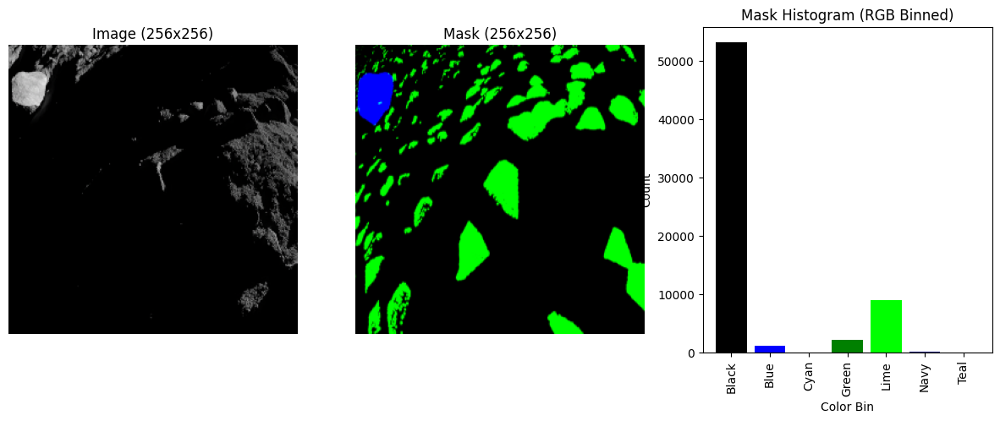

<ipython-input-13-642e1c86edb1>:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


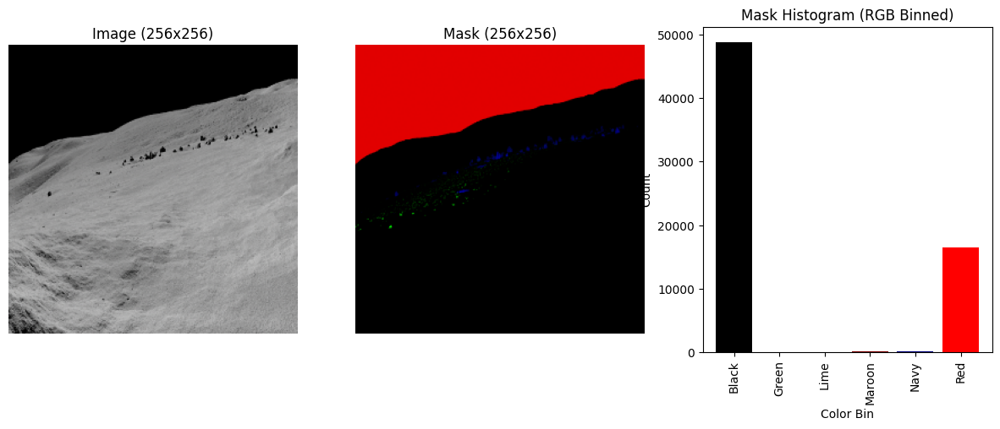

<ipython-input-13-642e1c86edb1>:51: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


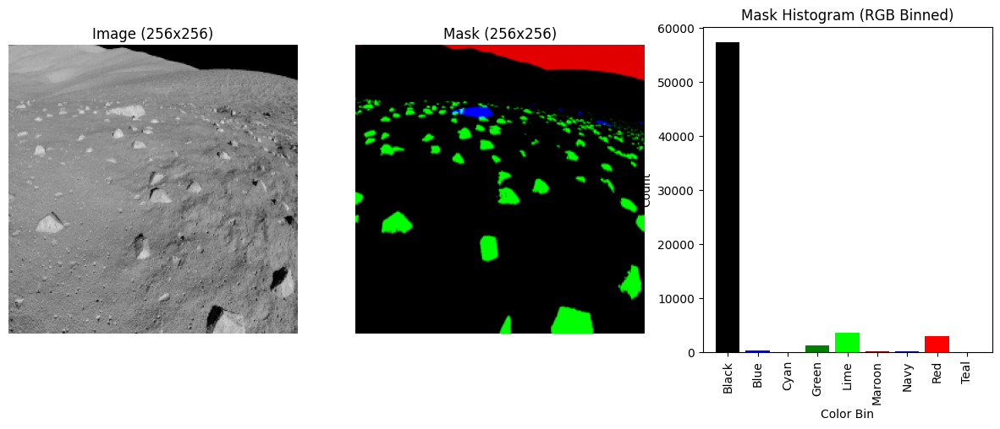

In [ ]:
"""Original masks with incorrect number of classes from the public dataset"""

import cv2
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader

# Define RGB bins for closest matching
RGB_BINS = {
    "Black": (0, 0, 0), "White": (255, 255, 255), "Red": (255, 0, 0), "Lime": (0, 255, 0),
    "Blue": (0, 0, 255), "Yellow": (255, 255, 0), "Cyan": (0, 255, 255), "Magenta": (255, 0, 255),
    "Silver": (192, 192, 192), "Gray": (128, 128, 128), "Maroon": (128, 0, 0), "Olive": (128, 128, 0),
    "Green": (0, 128, 0), "Purple": (128, 0, 128), "Teal": (0, 128, 128), "Navy": (0, 0, 128)
}

def closest_color(pixel):
    """Finds the closest color bin for a given pixel."""
    return min(RGB_BINS.keys(), key=lambda k: np.linalg.norm(np.array(RGB_BINS[k]) - np.array(pixel)))

def show_samples(dataset, N=5):
    """Displays N samples from the dataset along with their dimensions and mask histograms."""
    for i in range(N):
        image, mask = dataset[i]  # Get image and mask tensors



        # Get dimensions
        img_h, img_w, _ = image.shape
        mask_h, mask_w, _ = mask.shape

        # Map pixels to closest color bins
        mask_flat = mask.reshape(-1, 3)
        mapped_colors = np.array([closest_color(pixel) for pixel in mask_flat]).reshape(mask.shape[:2])
        unique_bins, counts = np.unique(mapped_colors, return_counts=True)

        # Plot
        fig, ax = plt.subplots(1, 3, figsize=(15, 5))
        ax[0].imshow(image)
        ax[0].set_title(f"Image ({img_w}x{img_h})")
        ax[0].axis("off")

        ax[1].imshow(mask)
        ax[1].set_title(f"Mask ({mask_w}x{mask_h})")
        ax[1].axis("off")

        bar_colors = [RGB_BINS[color] for color in unique_bins]
        ax[2].bar(unique_bins, counts, color=np.array(bar_colors) / 255)
        ax[2].set_title("Mask Histogram (RGB Binned)")
        ax[2].set_xlabel("Color Bin")
        ax[2].set_ylabel("Count")
        ax[2].set_xticklabels(unique_bins, rotation=90)

        plt.show()


# Assuming train_dataset is an instance of LunarRocksDatasetFromArray
original_dataset = LunarRocksDatasetFromDrive(TRAIN_DIR,TRAIN_MASK_DIR,INPUT_WIDTH=IMG_WIDTH,INPUT_HEIGHT=IMG_HEIGHT )
show_samples(original_dataset, N=5)
#clean
original_dataset = []




<ipython-input-9-275270257659>:80: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


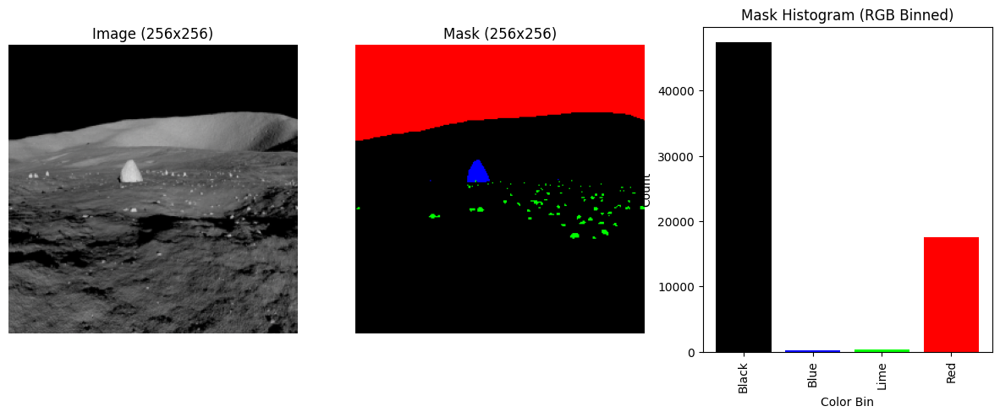

<ipython-input-9-275270257659>:80: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


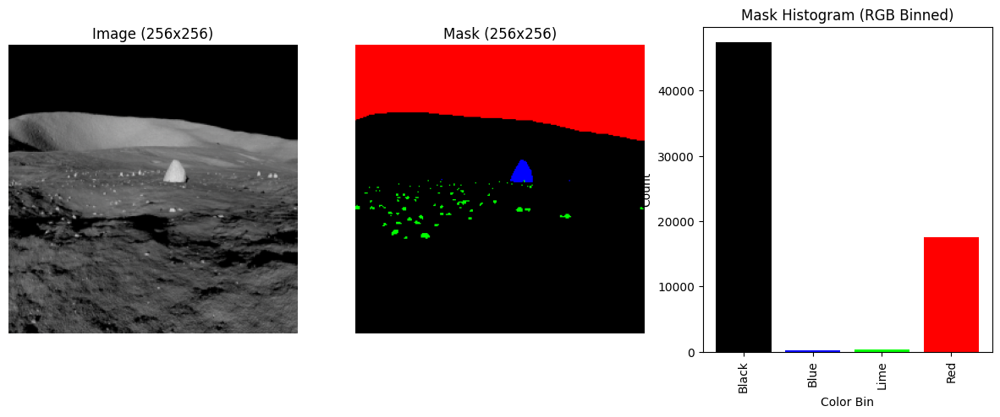

<ipython-input-9-275270257659>:80: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


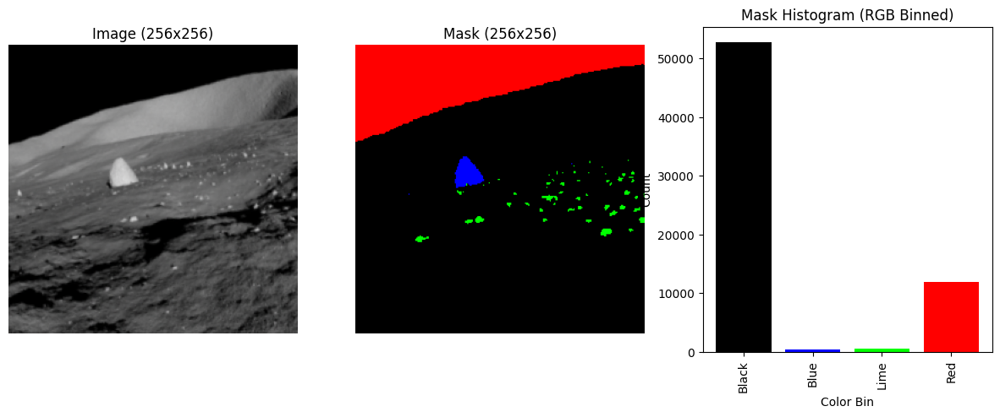

<ipython-input-9-275270257659>:80: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


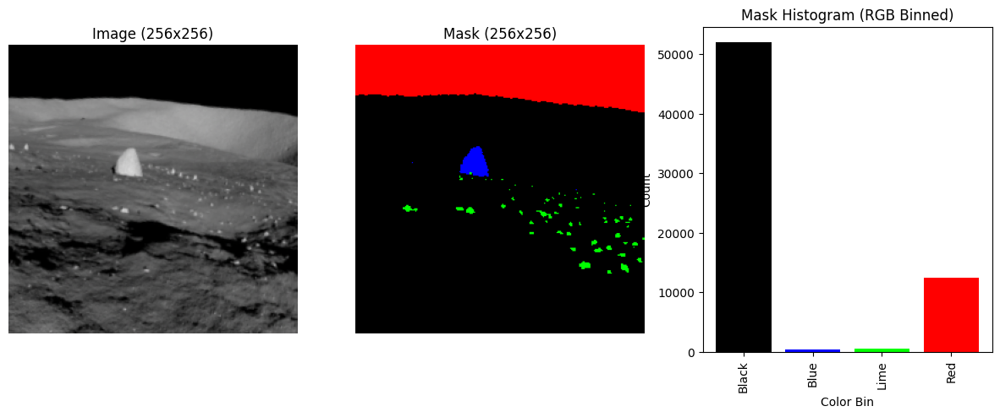

<ipython-input-9-275270257659>:80: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


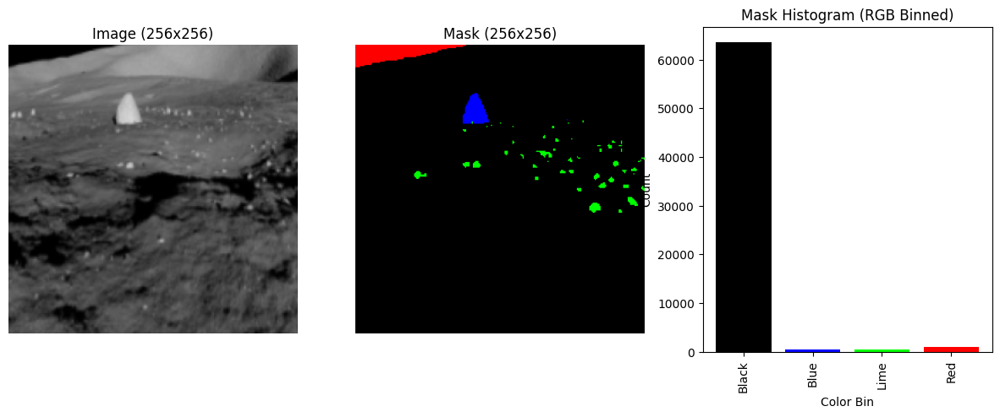

<ipython-input-9-275270257659>:80: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


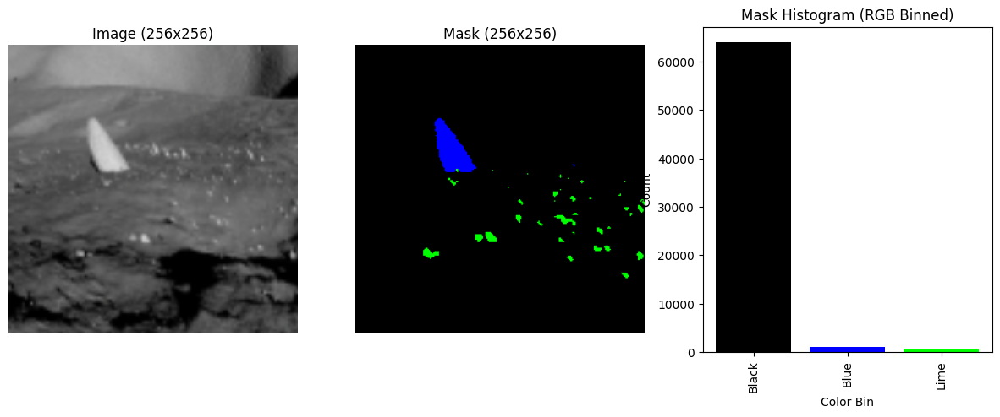

<ipython-input-9-275270257659>:80: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


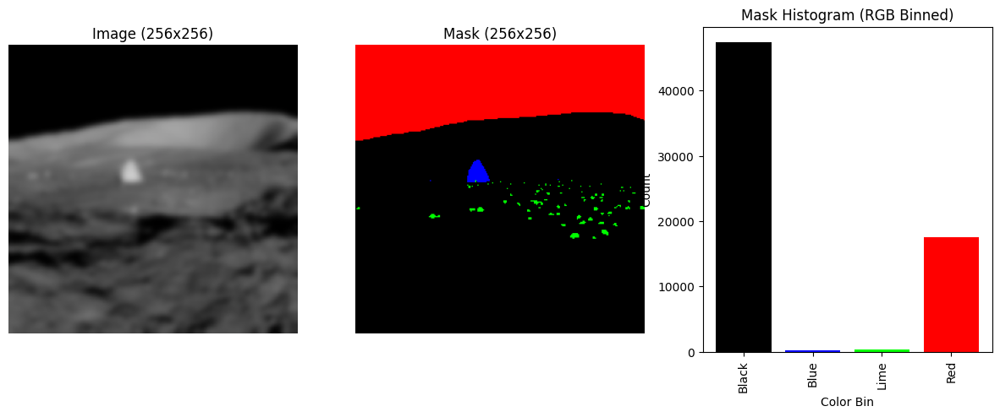

<ipython-input-9-275270257659>:80: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


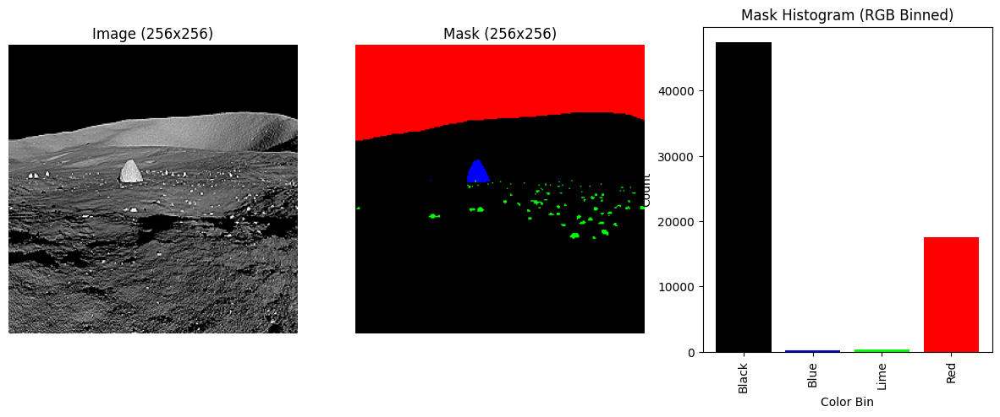

<ipython-input-9-275270257659>:80: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


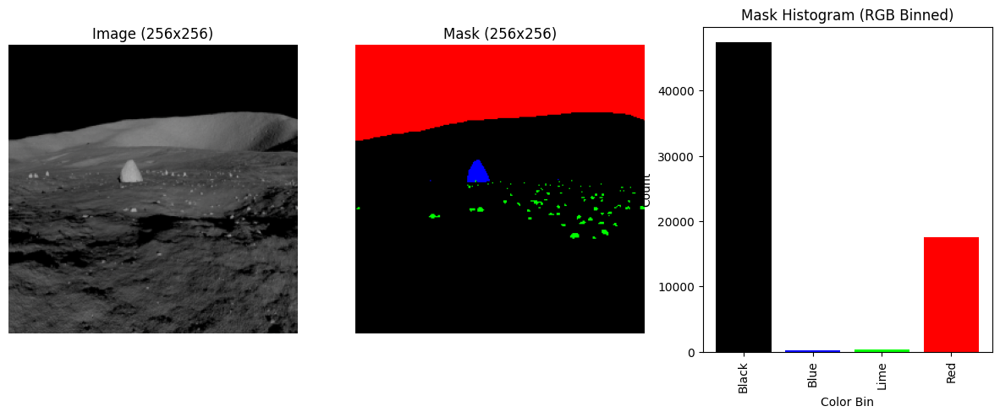

<ipython-input-9-275270257659>:80: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[2].set_xticklabels(unique_bins, rotation=90)


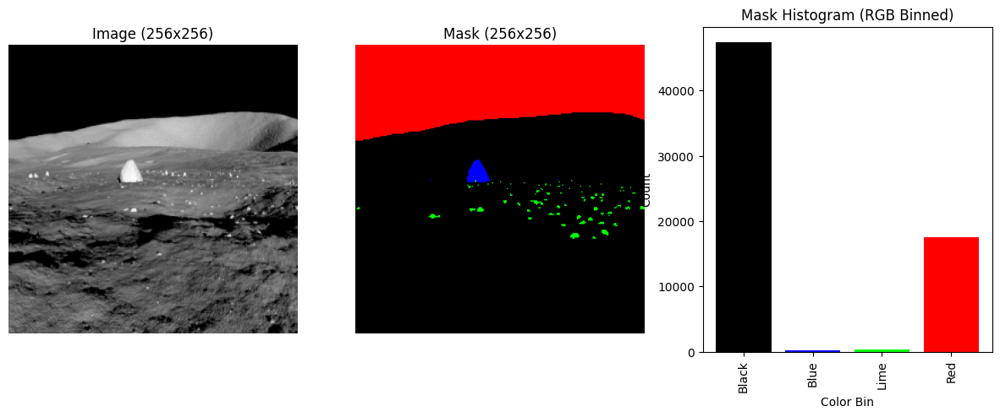

In [ ]:
"""Check the RGB histogram again. There should only be 4 colors correspondingh to 4 classes"""
import cv2
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from sklearn.neighbors import KDTree  # Fast nearest neighbor search

# Define RGB bins for closest matching
RGB_BINS = {
    "Black": (0, 0, 0), "White": (255, 255, 255), "Red": (255, 0, 0), "Lime": (0, 255, 0),
    "Blue": (0, 0, 255), "Yellow": (255, 255, 0), "Cyan": (0, 255, 255), "Magenta": (255, 0, 255),
    "Silver": (192, 192, 192), "Gray": (128, 128, 128), "Maroon": (128, 0, 0), "Olive": (128, 128, 0),
    "Green": (0, 128, 0), "Purple": (128, 0, 128), "Teal": (0, 128, 128), "Navy": (0, 0, 128)
}

# Convert RGB bins to a NumPy array for efficient KDTree search
bin_colors = np.array(list(RGB_BINS.values()))
bin_names = np.array(list(RGB_BINS.keys()))  # Convert to NumPy array for fast indexing

# Create KDTree for fast nearest color lookup
kd_tree = KDTree(bin_colors)

def closest_color_map(mask_rgb):
    """Finds the closest color for all pixels in an image mask using vectorized KDTree."""

    # Reshape image to (num_pixels, 3) for vectorized processing
    pixels = mask_rgb.reshape(-1, 3)

    # Query the KDTree for nearest neighbors (vectorized, no loop!)
    _, indices = kd_tree.query(pixels, k=1)

    # Map indices back to corresponding color names
    mapped_colors = bin_names[indices.flatten()].reshape(mask_rgb.shape[:2])  # Reshape back

    return mapped_colors

def show_samples(dataset, N=5):
    """Displays N samples from the dataset along with their dimensions and mask histograms."""
    for i in range(N):
        image, mask = dataset[i]  # Get image and mask tensors

        # Convert tensor image to NumPy array (H, W, C)
        image_np = image.permute(1, 2, 0).numpy()  # Convert CHW to HWC
        image_np = (image_np * 255).astype(np.uint8)  # Denormalize if needed

        # Convert mask from tensor to NumPy (ensure it's in RGB format)
        mask_np = mask.permute(1, 2, 0).numpy()  # Convert CHW to HWC for mask
        mask_np = (mask_np * 255).astype(np.uint8)  # Denormalize mask if needed

        # Convert RGB mask to BGR for OpenCV display
        mask_np = cv2.cvtColor(mask_np, cv2.COLOR_RGB2BGR)

        # Get dimensions
        img_h, img_w, _ = image_np.shape
        mask_h, mask_w, _ = mask_np.shape

        # Fast color mapping using KDTree
        mapped_colors = closest_color_map(mask_np)

        # Count unique color bins
        unique_bins, counts = np.unique(mapped_colors, return_counts=True)

        # Plot images and histograms
        fig, ax = plt.subplots(1, 3, figsize=(15, 5))
        ax[0].imshow(image_np)
        ax[0].set_title(f"Image ({img_w}x{img_h})")
        ax[0].axis("off")

        ax[1].imshow(mask_np)
        ax[1].set_title(f"Mask ({mask_w}x{mask_h})")
        ax[1].axis("off")

        # Convert bin colors for plotting
        bar_colors = [np.array(RGB_BINS[color]) / 255 for color in unique_bins]

        ax[2].bar(unique_bins, counts, color=bar_colors)
        ax[2].set_title("Mask Histogram (RGB Binned)")
        ax[2].set_xlabel("Color Bin")
        ax[2].set_ylabel("Count")
        ax[2].set_xticklabels(unique_bins, rotation=90)

        plt.show()

# Example usage:
show_samples(train_dataset, N=10)


In [8]:
#Unet model
import torch
import torch.nn as nn
import torchvision.transforms.functional as TF

class UNET(nn.Module):

    def __init__(self, in_channels=3, classes=1):
        super(UNET, self).__init__()
        self.layers = [in_channels, 64, 128, 256, 512, 1024]

        self.double_conv_downs = nn.ModuleList(
            [self.__double_conv(layer, layer_n) for layer, layer_n in zip(self.layers[:-1], self.layers[1:])])

        self.up_trans = nn.ModuleList(
            [nn.ConvTranspose2d(layer, layer_n, kernel_size=2, stride=2)
             for layer, layer_n in zip(self.layers[::-1][:-2], self.layers[::-1][1:-1])])

        self.double_conv_ups = nn.ModuleList(
        [self.__double_conv(layer, layer//2) for layer in self.layers[::-1][:-2]])

        self.max_pool_2x2 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.final_conv = nn.Conv2d(64, classes, kernel_size=1)


    def __double_conv(self, in_channels, out_channels):
        conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )
        return conv

    def forward(self, x):
        # down layers
        concat_layers = []

        for down in self.double_conv_downs:
            x = down(x)
            if down != self.double_conv_downs[-1]:
                concat_layers.append(x)
                x = self.max_pool_2x2(x)

        concat_layers = concat_layers[::-1]

        # up layers
        for up_trans, double_conv_up, concat_layer  in zip(self.up_trans, self.double_conv_ups, concat_layers):
            x = up_trans(x)
            if x.shape != concat_layer.shape:
                x = TF.resize(x, concat_layer.shape[2:])

            concatenated = torch.cat((concat_layer, x), dim=1)
            x = double_conv_up(concatenated)

        x = self.final_conv(x)

        return x

In [12]:
# # UNet - Training & Test
# import torch
# import torch.optim as optim
# import torch.nn as nn
# import matplotlib.pyplot as plt
# from tqdm import tqdm
# from torch.cuda.amp import autocast, GradScaler  # AMP for mixed precision

# MODEL_PATH = model_pth
# LEARNING_RATE = [1e-5, 3e-5, 1e-4, 3e-4, 1e-3, 3e-3, 1e-2]
# LEARNING_RATE = LEARNING_RATE[2] # for now 1e-4
# EPOCHS = 30

# # Set device
# DEVICE = "cuda:0" if torch.cuda.is_available() else "cpu"
# print(f"Running on {DEVICE}")

# # Model, optimizer, and loss function
# unet = UNET(in_channels=3, classes=4).to(DEVICE).train()
# optimizer = optim.Adam(unet.parameters(), lr=LEARNING_RATE)
# loss_function = nn.CrossEntropyLoss()

# # Enable mixed precision training
# scaler = GradScaler()

# def train_function(data, model, optimizer, loss_fn, device):
#     model.train()
#     loss_values = []
#     data = tqdm(data, leave=False, desc="Training")  # tqdm for progress bar

#     for X, y in data:
#         X, y = X.to(device), y.argmax(dim=1).to(device)  # Move data to device

#         optimizer.zero_grad()
#         with autocast():  # Enable mixed precision
#             preds = model(X)
#             loss = loss_fn(preds, y)

#         scaler.scale(loss).backward()  # Scale gradients
#         scaler.step(optimizer)
#         scaler.update()  # Adjust for mixed precision

#         loss_values.append(loss.item())

#     return sum(loss_values) / len(loss_values)  # Return avg loss

# LOSS_VALS = []

# for e in range(EPOCHS):
#     print(f"Epoch {e+1}/{EPOCHS}")
#     loss_val = train_function(train_dataloader, unet, optimizer, loss_function, DEVICE)
#     LOSS_VALS.append(loss_val)

#     torch.save({
#         'model_state_dict': unet.state_dict(),
#         'optim_state_dict': optimizer.state_dict(),
#         'epoch': e,
#         'loss_values': LOSS_VALS
#     }, MODEL_PATH)

#     print(f"Epoch {e+1} completed! Loss: {loss_val:.4f}")

# # Plot training loss
# plt.figure(figsize=(8, 5))
# plt.plot(range(1, len(LOSS_VALS) + 1), LOSS_VALS, marker='o', linestyle='-', color='b', label="Training Loss")
# plt.xlabel("Epochs")
# plt.ylabel("Loss")
# plt.title("UNet Training - Loss vs Epochs")
# plt.ylim(0, 1)
# plt.xticks(range(1, len(LOSS_VALS) + 1))
# plt.legend()
# plt.grid(True)
# plt.show()




Running on cuda:0


<ipython-input-12-797477dbe742>:97: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


Epoch 1/30


Training:   0%|          | 0/4883 [00:00<?, ?it/s]<ipython-input-12-797477dbe742>:126: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


RuntimeError: Given groups=1, weight of size [64, 3, 3, 3], expected input[4, 256, 256, 256] to have 3 channels, but got 256 channels instead

In [ ]:
#References: https://www.kaggle.com/code/vikram12301/multiclass-semantic-segmentation-pytorch
class encoding_block(nn.Module):
    def __init__(self,in_channels, out_channels):
        super(encoding_block,self).__init__()
        model = []
        model.append(nn.Conv2d(in_channels, out_channels, 3, 1, 1, bias=False))
        model.append(nn.BatchNorm2d(out_channels))
        model.append(nn.ReLU(inplace=True))
        model.append(nn.Conv2d(out_channels, out_channels, 3, 1, 1, bias=False))
        model.append(nn.BatchNorm2d(out_channels))
        model.append(nn.ReLU(inplace=True))
        self.conv = nn.Sequential(*model)
    def forward(self, x):
        return self.conv(x)

class unet_model(nn.Module):
    def __init__(self,out_channels=4,features=[64, 128, 256, 512]):
        super(unet_model,self).__init__()
        self.pool = nn.MaxPool2d(kernel_size=(2,2),stride=(2,2))
        self.conv1 = encoding_block(3,features[0])
        self.conv2 = encoding_block(features[0],features[1])
        self.conv3 = encoding_block(features[1],features[2])
        self.conv4 = encoding_block(features[2],features[3])
        self.conv5 = encoding_block(features[3]*2,features[3])
        self.conv6 = encoding_block(features[3],features[2])
        self.conv7 = encoding_block(features[2],features[1])
        self.conv8 = encoding_block(features[1],features[0])
        self.tconv1 = nn.ConvTranspose2d(features[-1]*2, features[-1], kernel_size=2, stride=2)
        self.tconv2 = nn.ConvTranspose2d(features[-1], features[-2], kernel_size=2, stride=2)
        self.tconv3 = nn.ConvTranspose2d(features[-2], features[-3], kernel_size=2, stride=2)
        self.tconv4 = nn.ConvTranspose2d(features[-3], features[-4], kernel_size=2, stride=2)
        self.bottleneck = encoding_block(features[3],features[3]*2)
        self.final_layer = nn.Conv2d(features[0],out_channels,kernel_size=1)
    def forward(self,x):
        skip_connections = []
        x = self.conv1(x)
        skip_connections.append(x)
        x = self.pool(x)
        x = self.conv2(x)
        skip_connections.append(x)
        x = self.pool(x)
        x = self.conv3(x)
        skip_connections.append(x)
        x = self.pool(x)
        x = self.conv4(x)
        skip_connections.append(x)
        x = self.pool(x)
        x = self.bottleneck(x)
        skip_connections = skip_connections[::-1]
        x = self.tconv1(x)
        x = torch.cat((skip_connections[0], x), dim=1)
        x = self.conv5(x)
        x = self.tconv2(x)
        x = torch.cat((skip_connections[1], x), dim=1)
        x = self.conv6(x)
        x = self.tconv3(x)
        x = torch.cat((skip_connections[2], x), dim=1)
        x = self.conv7(x)
        x = self.tconv4(x)
        x = torch.cat((skip_connections[3], x), dim=1)
        x = self.conv8(x)
        x = self.final_layer(x)
        return x


# UNet - Training & Test
import torch
import torch.optim as optim
import torch.nn as nn
import matplotlib.pyplot as plt
from tqdm import tqdm
from torch.cuda.amp import autocast, GradScaler  # AMP for mixed precision

MODEL_PATH = model_pth
LEARNING_RATE = [1e-5, 3e-5, 1e-4, 3e-4, 1e-3, 3e-3, 1e-2]
LEARNING_RATE = LEARNING_RATE[3] # for now 1e-4
#Presentaion & notes are based on 30 epochs I reduced this to 15 for demonstration purposes.
#In reality this should run for about ~100-150 epochs given the current performance.
EPOCHS = 15

# Set device
DEVICE = "cuda:0" if torch.cuda.is_available() else "cpu"
print(f"Running on {DEVICE}")

# Model, optimizer, and loss function
unet = unet_model(out_channels=4).to(DEVICE).train()
optimizer = optim.Adam(unet.parameters(), lr=LEARNING_RATE)
loss_function = nn.CrossEntropyLoss()

# Enable mixed precision training
scaler = GradScaler()

def train_function(data, model, optimizer, loss_fn, device):
    model.train()
    loss_values = []
    data = tqdm(data, leave=False, desc="Training")  # tqdm for progress bar

    for X, y in data:
        X, y = X.to(device), y.argmax(dim=1).to(device)  # Move data to device

        optimizer.zero_grad()
        with autocast():  # Enable mixed precision
            preds = model(X)
            loss = loss_fn(preds, y)

        scaler.scale(loss).backward()  # Scale gradients
        scaler.step(optimizer)
        scaler.update()  # Adjust for mixed precision

        loss_values.append(loss.item())

    return sum(loss_values) / len(loss_values)  # Return avg loss

LOSS_VALS = []

for e in range(EPOCHS):
    print(f"Epoch {e+1}/{EPOCHS}")
    loss_val = train_function(train_dataloader, unet, optimizer, loss_function, DEVICE)
    LOSS_VALS.append(loss_val)

    torch.save({
        'model_state_dict': unet.state_dict(),
        'optim_state_dict': optimizer.state_dict(),
        'epoch': e,
        'loss_values': LOSS_VALS
    }, MODEL_PATH)

    print(f"Epoch {e+1} completed! Loss: {loss_val:.4f}")

# Plot training loss
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(LOSS_VALS) + 1), LOSS_VALS, marker='o', linestyle='-', color='b', label="Training Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("UNet Training - Loss vs Epochs")
plt.ylim(0, 1)
plt.xticks(range(1, len(LOSS_VALS) + 1))
plt.legend()
plt.grid(True)
plt.show()

Running on cuda:0


<ipython-input-10-f035f2b695ed>:91: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


Epoch 1/15


Training:   0%|          | 0/4883 [00:00<?, ?it/s]<ipython-input-10-f035f2b695ed>:102: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():  # Enable mixed precision


Epoch 1 completed! Loss: 0.2026
Epoch 2/15


Epoch 2 completed! Loss: 0.1572
Epoch 3/15


Epoch 3 completed! Loss: 0.1404
Epoch 4/15


Epoch 4 completed! Loss: 0.1311
Epoch 5/15


Epoch 5 completed! Loss: 0.1250
Epoch 6/15


Training:  51%|█████     | 2479/4883 [03:55<03:54, 10.26it/s]

In [ ]:
os@Mars66789%
